<a href="https://colab.research.google.com/github/imamsyahrizal/KMeans_SocialNetworkAds/blob/main/KMeans_Clustering_Social_Networks_Ads.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tugas Kecerdasan Buatan
# Klasterisasi data Social Network Ads menggunakana algoritma KMeans Clustering

# Imam Syahrizal<br>18/424967/TK/46662

Social Netorks Ads berisi data pembelian produk atau tidak berdasarkan Jenis Kelamin, Umur, dan Perkiraan Pendapatan  
Data ini dapat dijadikan dataset klasifikasi dan juga klasterisasi karena juga terdapat groundtruth seorang beli atau tidak. Tapi dalam tugas ini data ini akan dijadikan data untuk pembelajaran tanpa bimbingan (Unsupervised Learning) sehingga data Purchased diabaikan.  
Sumber data di link  [berikut ini](https://www.kaggle.com/rakeshrau/social-network-ads)  


### Referensi 
1. K means Clustering without using Kmeans Library!! by Rizky Dewa Sakti [Link](https://www.youtube.com/watch?v=dySz0WGn0n8)
2. Accuracy, Precision, Recall & F1 Score: Interpretation of Performance Measures by Renuka Joshi [Link](https://blog.exsilio.com/all/accuracy-precision-recall-f1-score-interpretation-of-performance-measures/)
3. Step by Step Diabetes Classification-KNN-detailed by Shruti Iyyer [Link](https://www.kaggle.com/shrutimechlearn/step-by-step-diabetes-classification-knn-detailed)
4. K-Means Clustering: Python Implementation from Scratch by Khushijain [Link](https://medium.com/nerd-for-tech/k-means-python-implementation-from-scratch-8400f30b8e5c)
 

## Persiapan Google Drive dan direktori

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


masuk direktori

In [2]:
cd '/content/drive/MyDrive/Kuliah/Semester 7/Kecerdasan Buatan'

/content/drive/MyDrive/Kuliah/Semester 7/Kecerdasan Buatan


cek direktori saat ini

In [3]:
pwd

'/content/drive/MyDrive/Kuliah/Semester 7/Kecerdasan Buatan'

## Menambahkan library

In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random
import copy
from sklearn.preprocessing import LabelEncoder, MinMaxScaler

## Memasukkan dataset Social Networks Ads

In [5]:
sosial = pd.read_csv('Social_Network_Ads.csv')
sosial.head()

,User ID,Gender,Age,EstimatedSalary,Purchased
0,15624510,Male,19,19000,0
1,15810944,Male,35,20000,0
2,15668575,Female,26,43000,0
3,15603246,Female,27,57000,0
4,15804002,Male,19,76000,0


## Preprocessing data

cek kelengkapan data dan tipe data

In [6]:
sosial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   User ID          400 non-null    int64 
 1   Gender           400 non-null    object
 2   Age              400 non-null    int64 
 3   EstimatedSalary  400 non-null    int64 
 4   Purchased        400 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 15.8+ KB


In [7]:
sosial.describe()

,User ID,Age,EstimatedSalary,Purchased
count,4.000000e+02,400.000000,400.000000,400.000000
mean,1.569154e+07,37.655000,69742.500000,0.357500
std,7.165832e+04,10.482877,34096.960282,0.479864
min,1.556669e+07,18.000000,15000.000000,0.000000
25%,1.562676e+07,29.750000,43000.000000,0.000000
50%,1.569434e+07,37.000000,70000.000000,0.000000
75%,1.575036e+07,46.000000,88000.000000,1.000000
max,1.581524e+07,60.000000,150000.000000,1.000000


Gender bertipe objek maka diganti menjadi integer  
Tidak ada data kosong

In [8]:
sosial['Gender'] = LabelEncoder().fit_transform(sosial['Gender'])
sosial.head()

,User ID,Gender,Age,EstimatedSalary,Purchased
0,15624510,1,19,19000,0
1,15810944,1,35,20000,0
2,15668575,0,26,43000,0
3,15603246,0,27,57000,0
4,15804002,1,19,76000,0


### Mengambil data yang akan dilatih saja (Gender, Age, dan Estimated Salary)

In [9]:
data = sosial[['Gender', 'Age', 'EstimatedSalary']]
data.head()

,Gender,Age,EstimatedSalary
0,1,19,19000
1,1,35,20000
2,0,26,43000
3,0,27,57000
4,1,19,76000


### Cek Korelasi

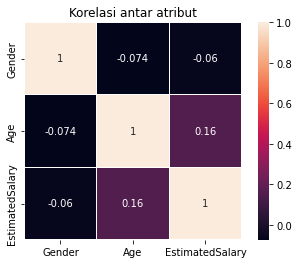

In [10]:
corr = data.corr()
sns.color_palette(as_cmap=True)
sns.heatmap(corr, vmax=1, linewidths=0.01, square=True, annot=True)
plt.title('Korelasi antar atribut')
plt.show()

### Membuang Gender
dari korelasi dapat dilihat bahwa Gender memberikan korelasi yang sangat rendah (negatif dan mendekati 0) sehingga dibuang saja

In [11]:
data = data.drop('Gender', axis=1)
data

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


### Visualisasi data 

Text(0, 0.5, 'Estimated Salary')

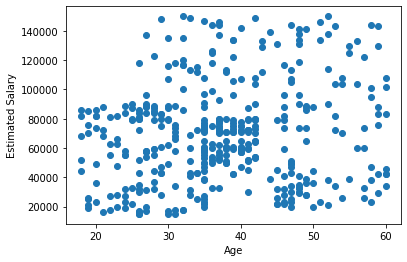

In [12]:
plt.scatter(data['Age'], data['EstimatedSalary'])
plt.xlabel('Age')
plt.ylabel('Estimated Salary')

### Scaling agar bobot antara attribut sama
karena perbedaan nilai yang jauh maka dilakukan scalling

In [13]:
normalisasi = MinMaxScaler()
data_df = normalisasi.fit_transform(data)
kolom = ['Age', 'EstimatedSalary']
data = pd.DataFrame(data_df, columns=kolom)
data.head()

,Age,EstimatedSalary
0,0.023810,0.029630
1,0.404762,0.037037
2,0.190476,0.207407
3,0.214286,0.311111
4,0.023810,0.451852


Text(0, 0.5, 'Estimated Salary')

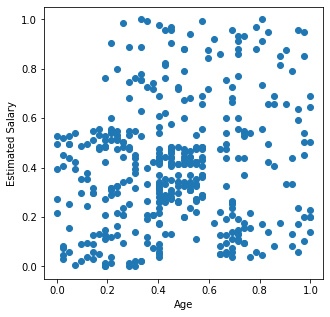

In [14]:
plt.figure(figsize=(5,5))
plt.scatter(data['Age'], data['EstimatedSalary'])
plt.xlabel('Age')
plt.ylabel('Estimated Salary')

## Klasterisasi (pengelompokkan) dengan KMeans Clustering
dalam klasterisasi ini hanya akan dikelompokkan menjadi dua kelompok yang harapannya mencerminkan kelompok orang yang membeli dan tidak membeli produk

### Variabel
*   sna  : data keseluruhan (data frame)
*   att1 : attribut 1 (Age)
*   att2 : attribut 2 (Estimated Salary)
*   k    : banyaknya klaster yang dibuat
*   cen  : centroid (pusat klaster)

In [15]:
# Inisiasi Klaster

def centroid_awal(sna, att1, att2, k):
  #centroid diambil sercara random dari data yang ada
  random.seed(5) #agar setiap pengulangan nilainya tetap
  centroid = {i + 1 : [random.choices(sna[att1]), random.choices(sna[att2])] for i in range(k)}
  
  return centroid

### Inisiasi Centroid (pusat klaster)

[[0.4047619047619047], [0.42962962962962964]]
[[0.6428571428571428], [0.43703703703703706]]


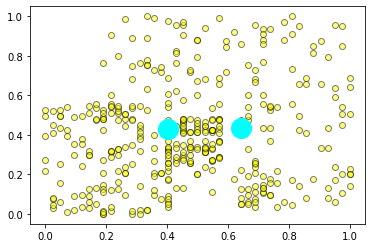

In [16]:
sna = data
att1 = 'Age'
att2 = 'EstimatedSalary'
k = 2

cen = centroid_awal(sna, att1, att2, k)
for i in cen:
  print(cen[i])

plt.scatter(sna[att1], sna[att2], color='yellow', alpha=0.5, edgecolor='black')
for i in cen :
  plt.scatter(cen[i][0], cen[i][1], color='cyan', s=400)
plt.show()

### Menghitung jarak setiap data ke masing-masing centroid

In [17]:
def jarak(sna, att1, att2, centroid):
  for i in centroid.keys():
    # dicari jarak dengan rumus pythagoras biasa
    jar = np.sqrt((sna[att1]-centroid[i][0])**2 + (sna[att2]-centroid[i][1])**2)
    #jarak dimasukkan kedalam data frame
    sna[str(i)] = jar
  return sna

In [18]:
sna2 = jarak(sna, att1, att2, cen)
sna2

,Age,EstimatedSalary,1,2
0,0.023810,0.029630,0.552381,0.741081
1,0.404762,0.037037,0.392593,0.465499
2,0.190476,0.207407,0.308709,0.507325
3,0.214286,0.311111,0.224339,0.446689
4,0.023810,0.451852,0.381600,0.619225
...,...,...,...,...
395,0.666667,0.192593,0.353243,0.245601
396,0.785714,0.059259,0.531318,0.403886
397,0.761905,0.037037,0.530735,0.417340
398,0.428571,0.133333,0.297251,0.371691


### Memilih keanggotaan berdasarkan jarak ke centroid yang paling pendek

In [19]:
def keanggotaan(sna, centroid):
  #menentukan klaster untuk setiap pasangan umur dan gaji
  klaster = (sna.loc[:, ['{}'.format(i) for i in centroid.keys()]].idxmin(axis=1)).astype('int')
  #hasil klaster akan ditambahkan ke data frame
  sna['klaster'] = klaster

  #diberikan pewarnaan yang berbeda untuk masing-masing klaster
  colmap = ['orange','red','olive','green','brown','purple','blue','gray','cyan','black','yellow','fuchsia']
  sna['warna'] = sna['klaster'].map(lambda x:colmap[x])

  return sna

In [20]:
sna2 = keanggotaan(sna2, cen)
sna2

,Age,EstimatedSalary,1,2,klaster,warna
0,0.023810,0.029630,0.552381,0.741081,1,red
1,0.404762,0.037037,0.392593,0.465499,1,red
2,0.190476,0.207407,0.308709,0.507325,1,red
3,0.214286,0.311111,0.224339,0.446689,1,red
4,0.023810,0.451852,0.381600,0.619225,1,red
...,...,...,...,...,...,...
395,0.666667,0.192593,0.353243,0.245601,2,olive
396,0.785714,0.059259,0.531318,0.403886,2,olive
397,0.761905,0.037037,0.530735,0.417340,2,olive
398,0.428571,0.133333,0.297251,0.371691,1,red


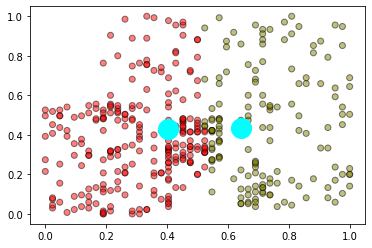

In [21]:
plt.scatter(sna[att1], sna[att2], color=sna2['warna'], alpha=0.5, edgecolor='black')
for i in cen:
  plt.scatter(cen[i][0], cen[i][1], color='cyan',s=400)
plt.show()

### Menentukan centroid baru dari rata-rata jarak masing-masing anggota klaster

In [22]:
def centroid_baru(sna, centroid):
  for i in centroid.keys():
    centroid[i][0] = np.mean(sna[sna['klaster'] == i][att1])
    centroid[i][1] = np.mean(sna[sna['klaster'] == i][att2])
  return centroid

In [23]:
centroid = centroid_baru(sna2, cen)

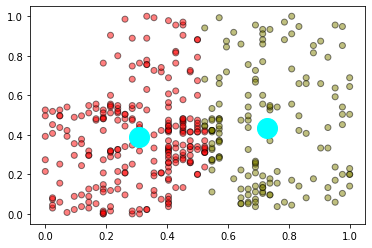

In [24]:
plt.scatter(sna[att1], sna[att2], color=sna2['warna'], alpha=0.5, edgecolor='black')
for i in cen:
  plt.scatter(cen[i][0], cen[i][1], color='cyan',s=400)
plt.show()

proses diatas diulangi terus menerus hingga mendapatkan centroid yang sama maka perulangan akan berhenti

### Pembuatan fungsi agar bisa digunakan untuk jumlah k yang lain secara mudah

In [25]:
def klaster(sna, att1, att2, k):
  pusat = centroid_awal(sna, att1, att2, k)
  #sna disalin agar ada data frame asli
  sna_baru = copy.deepcopy(sna)
  #mengukur jarak centroid awal ke masing-masing anggota
  sna_baru = jarak(sna_baru, att1, att2, pusat)
  #menentukan keanggotaan berdasar jarak yang sudah dicari
  sna_baru = keanggotaan(sna_baru, pusat)
  #update centroid baru dari keanggotaan yang baru
  pusat = centroid_baru(sna_baru, pusat)

  #proses yang sama dengan langkah diatas, tapi kali ini diulang ulang agar 
  #mendapatkan klasterisasi yang optimal akan berhenti jika centroid yang
  #diperoleh sudah tidak berubah

  iterasi=1
  while(True):
    #memasukkan nilai centroid menjadi nilai centroid lama
    pusat_lama = copy.deepcopy(pusat)
    #proses cari jarak
    sna_baru = jarak(sna_baru, att1, att2, pusat)
    #menentukan keanggotaan pasangan umur dan gaji berdasar jarak ke centroid yang baru
    sna_baru = keanggotaan(sna_baru, pusat)

    print('Iterasi : '+str(iterasi))
    iterasi+=1
    print('Centroid : ')
    for a in pusat:
      print(*pusat[a])
    
    #plot setiap pembaruan
    plt.figure(figsize=(5,5))
    plt.scatter(sna_baru[att1], sna_baru[att2], color=sna_baru['warna'], alpha=0.5, edgecolor='black')
    for i in pusat:
      plt.scatter(*pusat[i],color='cyan', s=400)
    plt.xlabel(att1)
    plt.ylabel(att2)
    plt.show()

    #mencari centroid baru berdasarkan anggota klaster yang baru
    pusat = centroid_baru(sna_baru, pusat)

    #berhenti jika centroid yang baru sama dengan centroid sebelumnya
    if(pusat == pusat_lama):
      break
    
  return(sna_baru, pusat)


## Proses Klasterisasi

Iterasi : 1
Centroid : 
0.30923579109062965 0.3866188769414574
0.7269736842105263 0.4363060428849904


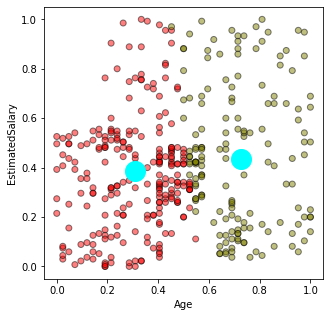

Iterasi : 2
Centroid : 
0.3029761904761904 0.3749382716049381
0.7154761904761904 0.45134259259259296


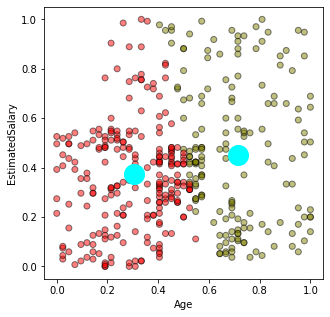

Iterasi : 3
Centroid : 
0.2974137931034482 0.36178160919540225
0.7035147392290249 0.46587301587301605


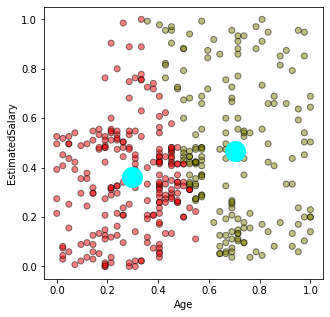

Iterasi : 4
Centroid : 
0.29177295918367324 0.35165343915343916
0.6922348484848485 0.4740319865319867


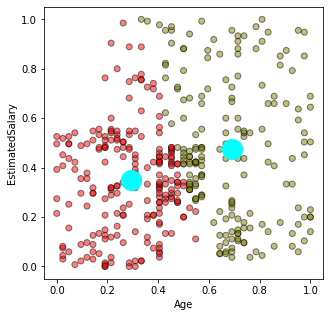

Iterasi : 5
Centroid : 
0.28416389811738624 0.3457019810508181
0.6815958815958816 0.474994994994995


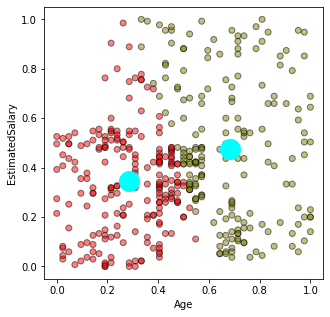

Iterasi : 6
Centroid : 
0.2816519972918074 0.34021414779708614
0.675988914084152 0.47838526357044875


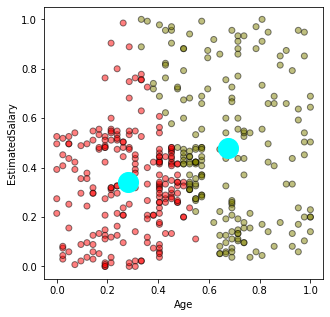

Iterasi : 7
Centroid : 
0.2811791383219952 0.33841269841269833
0.6744360902255637 0.4796491228070175


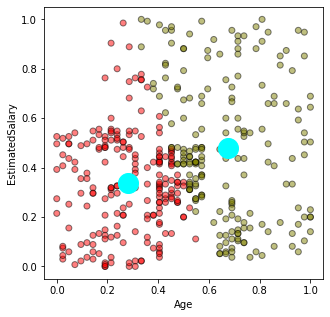

Iterasi : 8
Centroid : 
0.27762367082755407 0.336281912980942
0.670103092783505 0.4789996181748759


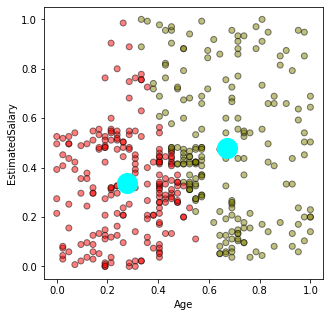

Iterasi : 9
Centroid : 
0.27504105090311964 0.334245575624886
0.6667875271936183 0.47892460988907687


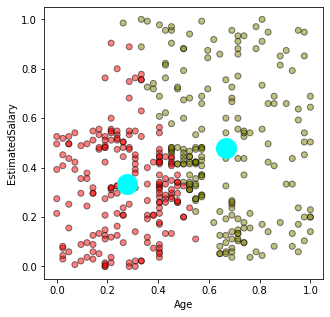

Iterasi : 10
Centroid : 
0.27291217994735567 0.3277126372603761
0.6610992655768773 0.4825133591302745


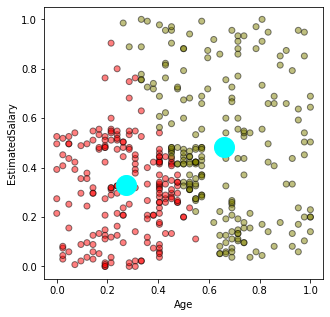

Iterasi : 11
Centroid : 
0.2690972222222221 0.3161651234567902
0.6515567765567766 0.4879629629629629


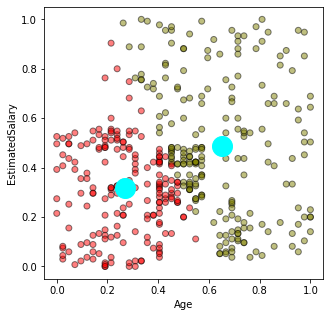

Iterasi : 12
Centroid : 
0.2650878533231474 0.31107149930679356
0.6460988151128996 0.48840201704051456


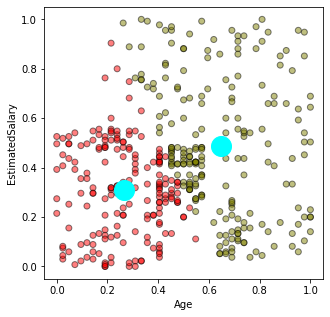

Iterasi : 13
Centroid : 
0.263063063063063 0.3099899899899901
0.644296788482835 0.48768303186907824


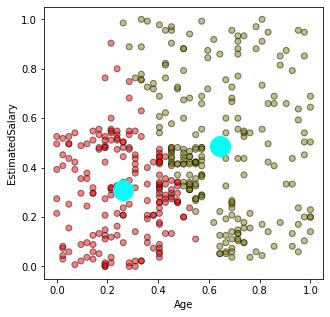

In [26]:
data_baru = klaster(sna, att1, att2, 2)

## Membandingkan hasil KMeans dengan Ground Truth
Pengelompokkan yang dihasilkan dari pembelajaran tanpa contoh (unsupervised learning) dibandingkan dengan ground truth Purchased

### Mengambil Ground Truth

In [27]:
gt = sosial['Purchased']
gt.head(10)

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    1
8    0
9    0
Name: Purchased, dtype: int64

### Mengambil hasil prediksi
selain itu juga dilakukan perubahan isi dimana hasil dari pengelompokkan yang dibentuk adalah klaster 1 dan 2, sementara di Ground Truth adalah 0 dan 1, maka diubah 1:0 dan 2:1

In [28]:
prediksi = sna['klaster']
prediksi = prediksi.replace(1,0)
prediksi = prediksi.replace(2,1)
prediksi.head(10)

0    0
1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
Name: klaster, dtype: int64

### Mencari Akurasi, Presisi, Recall, dan F1


#### Mencari nilai TP, TN, FP, FN
anggapan klaster 0 adalah positif dan klaster 1 adalah negatif

In [29]:
TP = 0
FP = 0
FN = 0
TN = 0

for i in range(len(gt)):
  if(gt[i]==0 and prediksi[i]==0):
    TP+=1
  if(gt[i]==0 and prediksi[i]==1):
    FN+=1
  if(gt[i]==1 and prediksi[i]==0):
    FP+=1
  if(gt[i]==1 and prediksi[i]==1):
    TN+=1

print('True Positif : {}'.format(TP))
print('False Positif : {}'.format(FP))
print('False Negatif : {}'.format(FN))
print('False Positif : {}'.format(TN))

True Positif : 211
False Positif : 37
False Negatif : 46
False Positif : 106


In [30]:
akurasi = (TP+TN)/(TP+FP+FN+TN)
presisi = TP/(TP+FP)
recall = TP/(TP+FN)
f1 = 2*(presisi*recall)/(presisi+recall)

print('Akurasi : {} \nPresisi : {} \nRecall : {} \nF1-Score : {} \n'.format(akurasi, presisi, recall,f1))

Akurasi : 0.7925 
Presisi : 0.8508064516129032 
Recall : 0.8210116731517509 
F1-Score : 0.8356435643564356 



#### dibandingkan dengan menggunakan sklearn

In [31]:
from sklearn.metrics import classification_report
print(classification_report(gt,prediksi))

              precision    recall  f1-score   support

           0       0.85      0.82      0.84       257
           1       0.70      0.74      0.72       143

    accuracy                           0.79       400
   macro avg       0.77      0.78      0.78       400
weighted avg       0.80      0.79      0.79       400



hasilnya sama

### Membuat Matriks Konfusi

In [32]:
cnf = np.array([[TP, FN],
                [FP, TN]])
cnf

array([[211,  46],
       [ 37, 106]])

Text(0.5, 15.0, 'Hasil Prediksi')

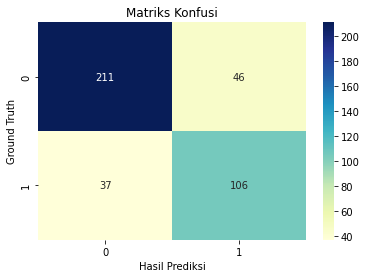

In [33]:
sns.heatmap(cnf, annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('Matriks Konfusi', y=1.1)
plt.ylabel('Ground Truth')
plt.xlabel('Hasil Prediksi')

## Penentuan banyak klaster optimum
dilihat dari persebaran datanya, klaster sebanyak dua bukan angka yang tepat. Oleh karenanya dicoba dengan k lain menggunakan Metode Elbow

### Rumus Sum Squared Error
merupakan salah satu rumus yang sering digunakan dalam mencari banyaknya error. Disini akan dicari jarak masing-masing anggota ke centroid, tapi jarak yang digunakan adalah jarak kuadrat agar tidak ada nilai negatif

In [34]:
def eror_sse(sna, pusat):
  jumlah = 0
  for i in range(len(pusat)):
    j = i+1
    k = sna[(sna['klaster']==j)]['{}'.format(j)]**2
    jumlah += k.sum()

  return jumlah

### Rumus WCSS (Within Cluster Sum of Squares)
merupakan jumlahan dari semua jarak setiap anggota ke masing-masing centroid

Iterasi : 1
Centroid : 
0.4679761904761906 0.4055


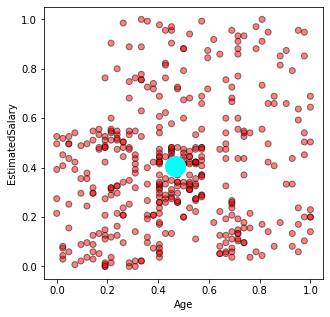

Iterasi : 1
Centroid : 
0.30923579109062965 0.3866188769414574
0.7269736842105263 0.4363060428849904


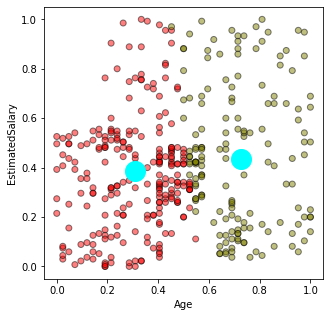

Iterasi : 2
Centroid : 
0.3029761904761904 0.3749382716049381
0.7154761904761904 0.45134259259259296


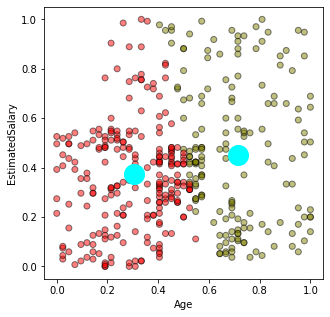

Iterasi : 3
Centroid : 
0.2974137931034482 0.36178160919540225
0.7035147392290249 0.46587301587301605


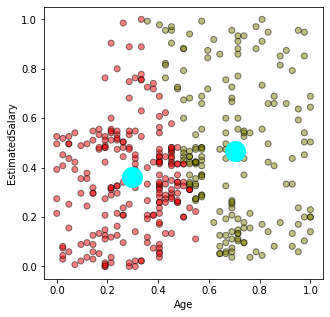

Iterasi : 4
Centroid : 
0.29177295918367324 0.35165343915343916
0.6922348484848485 0.4740319865319867


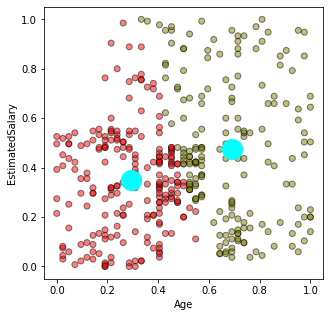

Iterasi : 5
Centroid : 
0.28416389811738624 0.3457019810508181
0.6815958815958816 0.474994994994995


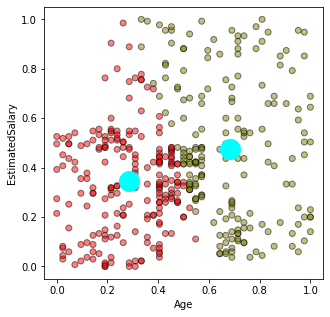

Iterasi : 6
Centroid : 
0.2816519972918074 0.34021414779708614
0.675988914084152 0.47838526357044875


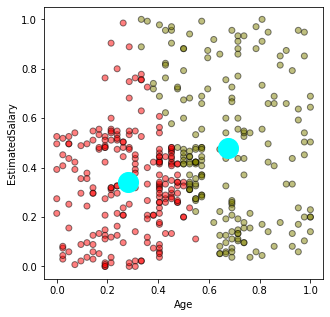

Iterasi : 7
Centroid : 
0.2811791383219952 0.33841269841269833
0.6744360902255637 0.4796491228070175


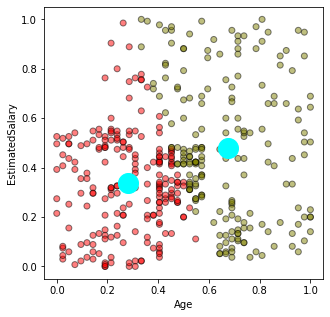

Iterasi : 8
Centroid : 
0.27762367082755407 0.336281912980942
0.670103092783505 0.4789996181748759


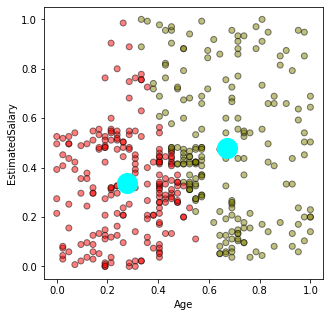

Iterasi : 9
Centroid : 
0.27504105090311964 0.334245575624886
0.6667875271936183 0.47892460988907687


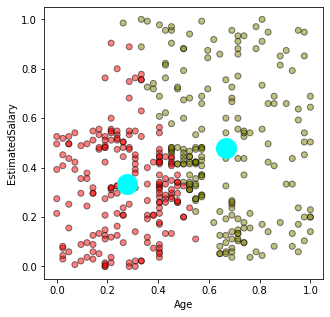

Iterasi : 10
Centroid : 
0.27291217994735567 0.3277126372603761
0.6610992655768773 0.4825133591302745


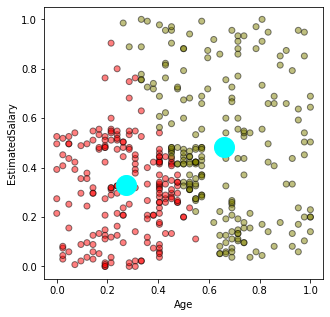

Iterasi : 11
Centroid : 
0.2690972222222221 0.3161651234567902
0.6515567765567766 0.4879629629629629


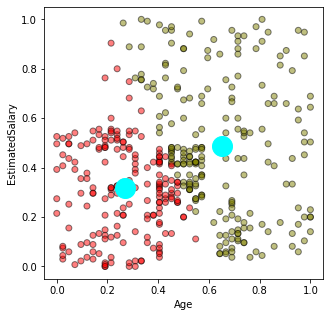

Iterasi : 12
Centroid : 
0.2650878533231474 0.31107149930679356
0.6460988151128996 0.48840201704051456


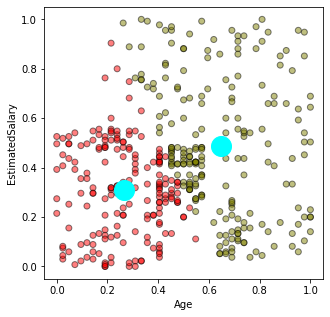

Iterasi : 13
Centroid : 
0.263063063063063 0.3099899899899901
0.644296788482835 0.48768303186907824


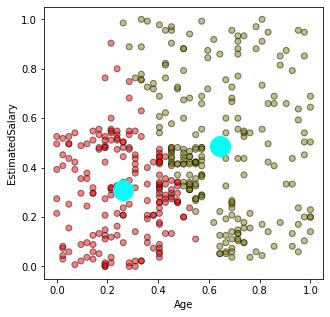

Iterasi : 1
Centroid : 
0.24408602150537625 0.4652807646356033
0.7374338624338623 0.44315843621399165
0.42739273927392735 0.26006600660066004


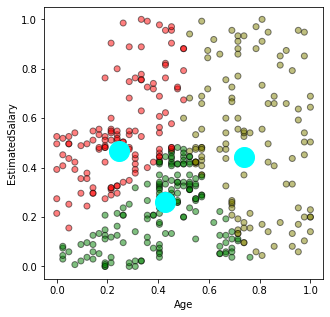

Iterasi : 2
Centroid : 
0.2574160811865729 0.5460230722525804
0.7539682539682542 0.506111111111111
0.4133514165159733 0.22058134083450523


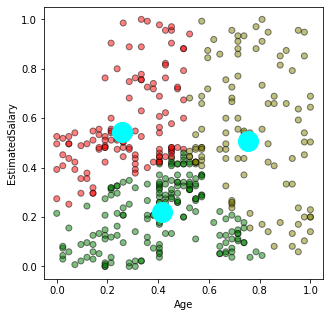

Iterasi : 3
Centroid : 
0.2817126850740295 0.571490818549642
0.7594570538495774 0.541086881273797
0.4161193212917349 0.20859940400170277


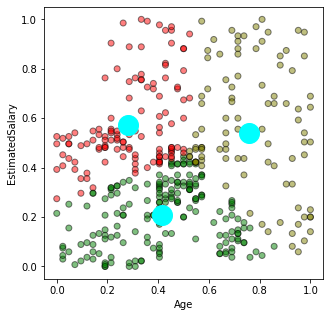

Iterasi : 4
Centroid : 
0.2922619047619046 0.5762962962962963
0.7657527657527659 0.5610924055368498
0.42159957905814244 0.20716185799058723


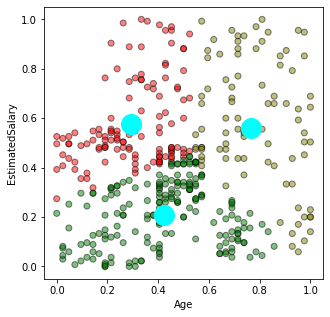

Iterasi : 5
Centroid : 
0.29752066115702475 0.5766146311600856
0.7825040128410913 0.5840199750312108
0.42919799498746863 0.2129044834307992


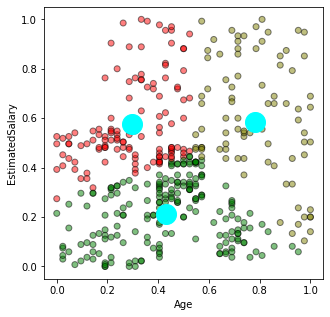

Iterasi : 6
Centroid : 
0.29752066115702475 0.5766146311600856
0.7851473922902491 0.6032627865961199
0.43711843711843706 0.21413105413105418


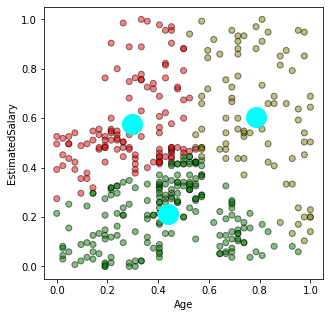

Iterasi : 7
Centroid : 
0.2943722943722943 0.5715335169880624
0.784863945578231 0.6088183421516754
0.4391941391941392 0.21489078822412155


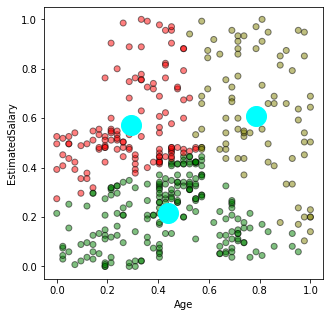

Iterasi : 8
Centroid : 
0.2964480874316939 0.5707953855494837
0.7886537330981772 0.6182898948331046
0.4423495286439449 0.21564203797706338


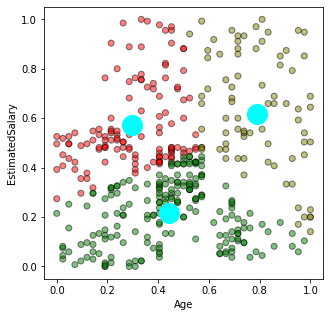

Iterasi : 9
Centroid : 
0.2984901277584203 0.5704908160192711
0.7881562881562879 0.6316239316239316
0.4472361809045226 0.21488926112041692


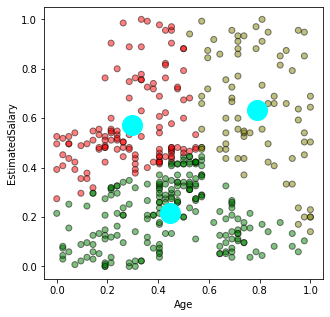

Iterasi : 1
Centroid : 
0.3776190476190477 0.5008888888888889
0.7374338624338623 0.44315843621399165
0.42739273927392735 0.26006600660066004
0.18049886621315187 0.4483245149911816


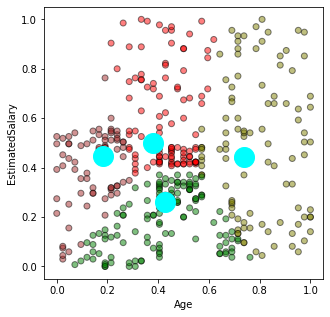

Iterasi : 2
Centroid : 
0.43210749646393226 0.6068940227356071
0.7911362564827911 0.4827282728272827
0.4216347956505436 0.18769320501603964
0.1421864520456069 0.3987480438184663


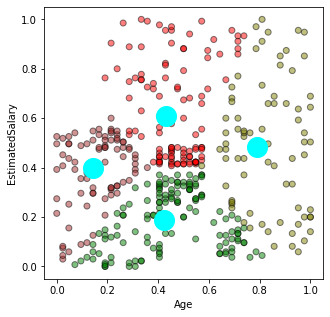

Iterasi : 3
Centroid : 
0.4664902998236331 0.635048010973937
0.8317460317460313 0.4905679012345678
0.45099061522419187 0.18702351987023516
0.15803571428571422 0.3899999999999999


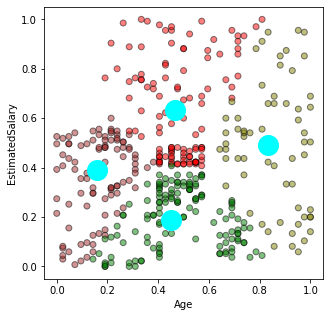

Iterasi : 4
Centroid : 
0.48219648219648215 0.6466466466466467
0.8548752834467116 0.490299823633157
0.48549946294307184 0.19537733221943743
0.16385048643113154 0.3607327757865393


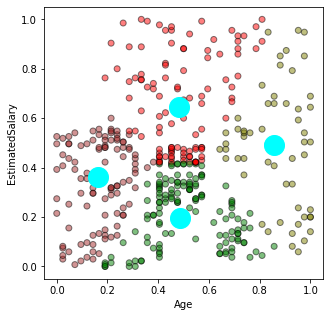

Iterasi : 5
Centroid : 
0.49079065588499554 0.670859538784067
0.8681972789115642 0.48584656084656075
0.5096288515406161 0.2137254901960784
0.169000933706816 0.3413217138707334


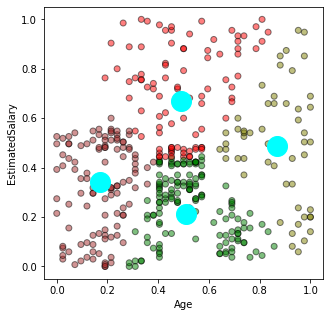

Iterasi : 6
Centroid : 
0.49564772145417313 0.7092791716447632
0.8706199460916436 0.4895877009084556
0.5288045288045288 0.24071484071484062
0.17417417417417413 0.323123123123123


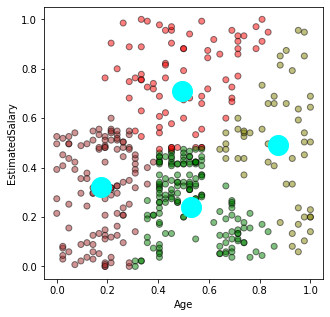

Iterasi : 7
Centroid : 
0.4987789987789988 0.7579297245963914
0.8706199460916436 0.4895877009084556
0.5285714285714285 0.2652329749103942
0.17731829573934837 0.31598440545808965


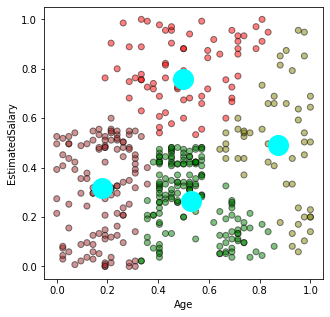

Iterasi : 8
Centroid : 
0.5049019607843137 0.7971677559912855
0.8706199460916436 0.4895877009084556
0.5285126396237506 0.27992684042066757
0.1803011803011803 0.31364355808800254


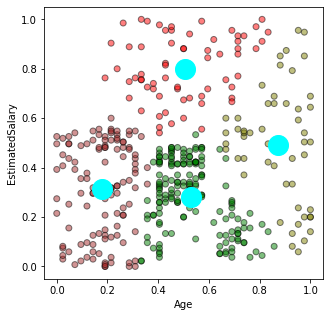

Iterasi : 9
Centroid : 
0.5018037518037518 0.8041526374859709
0.8749999999999994 0.49301994301994284
0.5301587301587302 0.2835914702581369
0.1803011803011803 0.31364355808800254


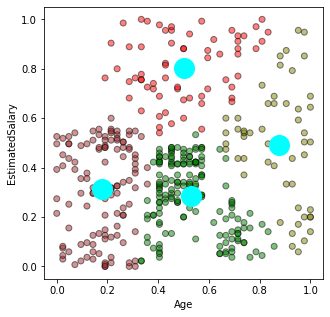

Iterasi : 1
Centroid : 
0.3500643500643501 0.39739739739739743
0.739177489177489 0.31845117845117826
0.42739273927392735 0.26006600660066004
0.1537037037037036 0.3776954732510288
0.5794930875576036 0.8420549581839906


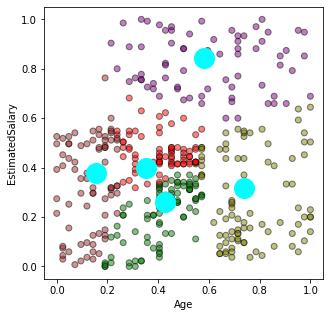

Iterasi : 2
Centroid : 
0.4120634920634921 0.4609382716049383
0.7632575757575757 0.2778619528619528
0.4122525414660246 0.2135663753641282
0.13172541743970306 0.3358345358345359
0.5955734406438631 0.8212832550860721


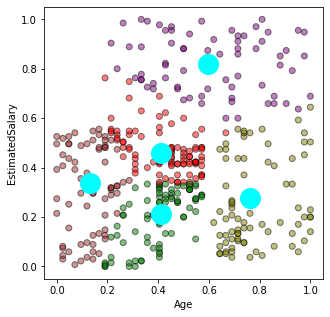

Iterasi : 3
Centroid : 
0.42664742664742666 0.4675645342312009
0.7844774273345702 0.2526214526214526
0.4004065040650407 0.2004516711833786
0.12731481481481477 0.31265432098765433
0.6078231292517006 0.8215873015873019


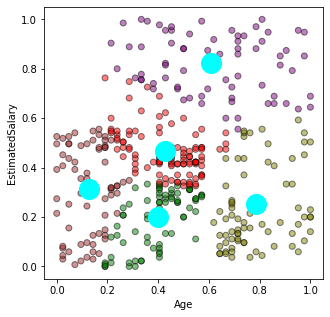

Iterasi : 4
Centroid : 
0.4352813852813853 0.4628282828282828
0.7876984126984126 0.23343621399176953
0.3916040100250627 0.19025341130604295
0.12575452716297783 0.31038080333854984
0.618376928236083 0.8166927490871154


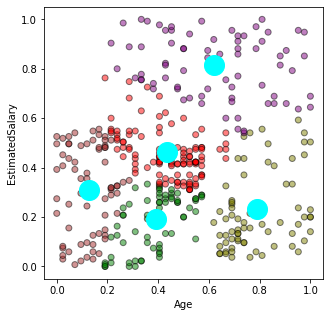

Iterasi : 5
Centroid : 
0.43965517241379315 0.45638569604086854
0.7908902691511386 0.2214707461084272
0.3846411804158283 0.18122065727699535
0.12575452716297783 0.31038080333854984
0.6216568819308546 0.8092338914256724


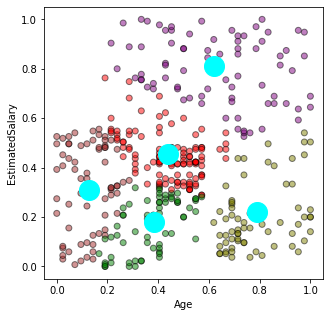

Iterasi : 6
Centroid : 
0.44337735094037606 0.4478057889822597
0.789377289377289 0.2010256410256409
0.3721988795518207 0.16884531590413945
0.12585034013605437 0.31925925925925924
0.628205128205128 0.795061728395062


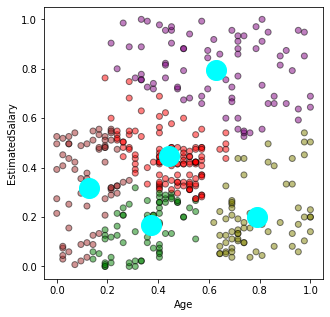

Iterasi : 7
Centroid : 
0.45140515222482425 0.43770491803278694
0.789377289377289 0.2010256410256409
0.3471926083866382 0.15378662244333885
0.1257002801120448 0.34433551198257073
0.628205128205128 0.795061728395062


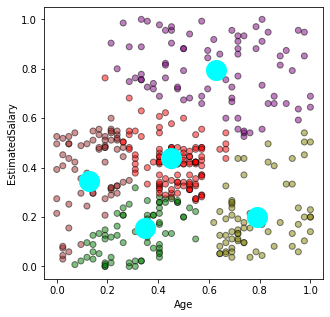

Iterasi : 8
Centroid : 
0.46589991928974983 0.42165725047080993
0.789377289377289 0.2010256410256409
0.31642512077294677 0.13601717659688675
0.13795518207282909 0.3903050108932462
0.6211309523809522 0.7931481481481483


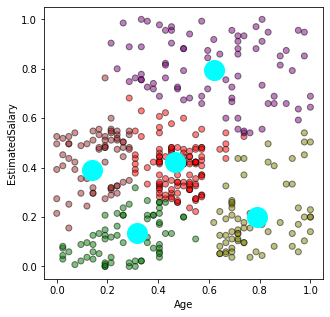

Iterasi : 9
Centroid : 
0.48035714285714276 0.404567901234568
0.789377289377289 0.2010256410256409
0.2717086834733894 0.11612200435729847
0.15896358543417363 0.43769063180827894
0.6196503918022904 0.7965307079231132


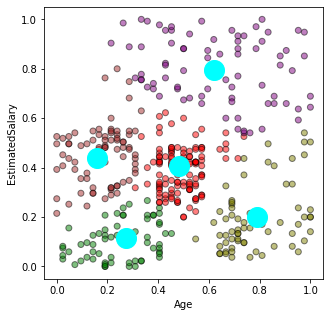

Iterasi : 10
Centroid : 
0.4909963985594237 0.3911609088079677
0.7868131868131866 0.1960113960113959
0.2488479262672812 0.10394265232974911
0.17872603586889296 0.4556998556998557
0.6289424860853431 0.7971139971139974


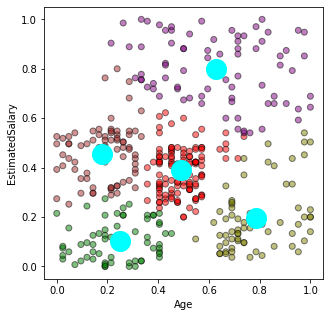

Iterasi : 11
Centroid : 
0.4919967987194877 0.3882975412387179
0.7868131868131866 0.1960113960113959
0.23771730914588063 0.10593768371546149
0.18546365914786964 0.46315789473684216
0.6289424860853431 0.7971139971139974


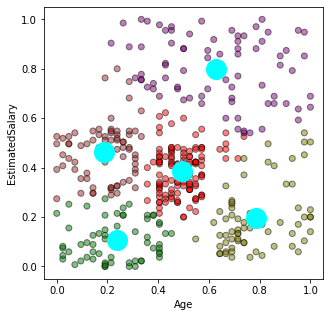

Iterasi : 12
Centroid : 
0.4912698412698412 0.38685185185185206
0.7868131868131866 0.1960113960113959
0.2320483749055178 0.10652557319223985
0.18730158730158725 0.46597530864197534
0.6289424860853431 0.7971139971139974


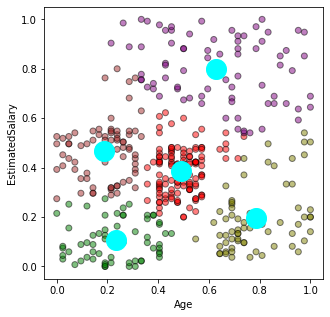

Iterasi : 13
Centroid : 
0.4912698412698412 0.38685185185185206
0.7868131868131866 0.1960113960113959
0.2320483749055178 0.10652557319223985
0.1889097744360902 0.4698830409356727
0.6331453634085211 0.7975633528265109


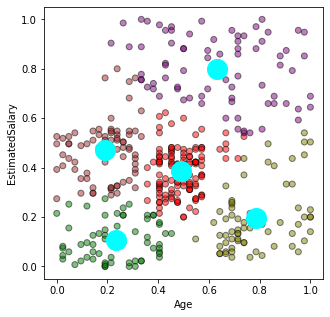

Iterasi : 1
Centroid : 
0.3500643500643501 0.39739739739739743
0.7317927170868345 0.4418300653594771
0.4576719576719575 0.3342592592592592
0.15367965367965356 0.38535353535353534
0.5794930875576036 0.8420549581839906
0.5763209393346381 0.09954337899543379


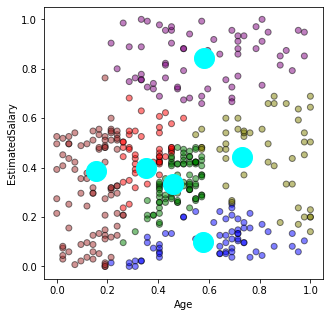

Iterasi : 2
Centroid : 
0.35714285714285726 0.46264090177133665
0.8119047619047615 0.45451851851851865
0.47913322632423744 0.33632958801498114
0.1439272338148741 0.31260923845193506
0.5695684523809522 0.8399305555555556
0.6171274961597544 0.10776583034647551


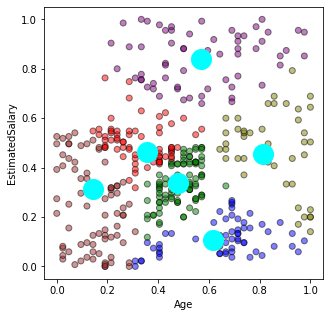

Iterasi : 3
Centroid : 
0.32611832611832625 0.5026936026936024
0.8514739229024939 0.47530864197530864
0.48657548125633243 0.3355397951142632
0.14224664224664219 0.23960113960113952
0.5683563748079876 0.8421744324970134
0.6522988505747126 0.1140485312899106


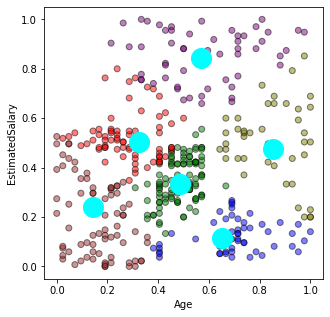

Iterasi : 4
Centroid : 
0.28571428571428575 0.5234567901234568
0.8475056689342401 0.5056437389770723
0.48506069094304394 0.3450980392156861
0.1609523809523809 0.19348148148148145
0.5774891774891774 0.8533333333333334
0.6984126984126983 0.12277091906721536


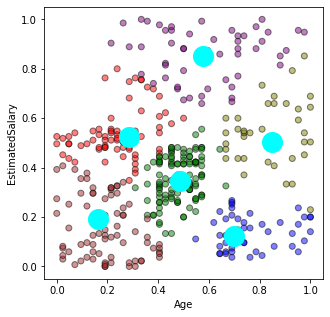

Iterasi : 5
Centroid : 
0.2387853692201518 0.5390230810520666
0.8384813384813383 0.5385385385385385
0.48012422360248436 0.3560708534621579
0.19460317460317456 0.1568395061728395
0.5867026055705301 0.8570230607966459
0.7605042016806721 0.13623819898329703


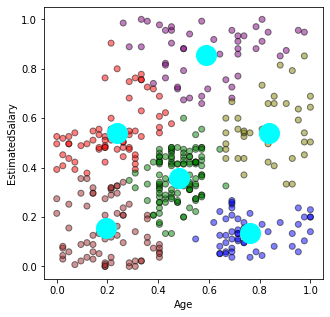

Iterasi : 6
Centroid : 
0.21904761904761902 0.5455026455026453
0.8314536340852129 0.5573099415204678
0.47699079631852725 0.3613445378151261
0.20469576719576715 0.14444444444444443
0.5913508260447036 0.8624338624338628
0.76510989010989 0.13803418803418804


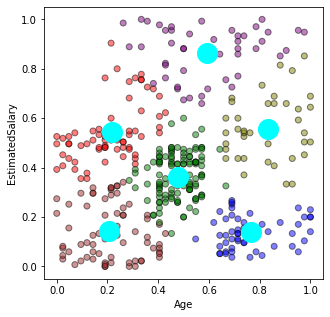

Iterasi : 7
Centroid : 
0.21122448979591832 0.5417989417989417
0.8278388278388277 0.5604938271604937
0.4763905562224889 0.36694677871148473
0.21329365079365079 0.13878600823045267
0.5892857142857143 0.8662037037037039
0.76510989010989 0.13803418803418804


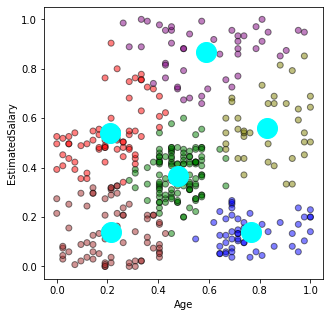

Iterasi : 8
Centroid : 
0.2091836734693877 0.5389417989417987
0.8320802005012529 0.5637426900584794
0.4796206618240515 0.3733207784055243
0.21975546975546972 0.13843843843843842
0.5892857142857143 0.8662037037037039
0.76510989010989 0.13803418803418804


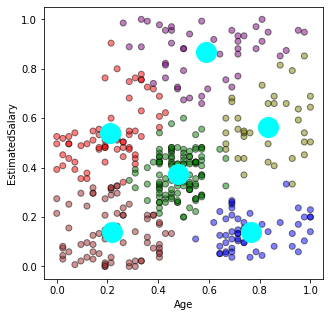

Iterasi : 9
Centroid : 
0.2091836734693877 0.5389417989417987
0.8301158301158299 0.5699699699699698
0.4798534798534797 0.3753719531497311
0.22285714285714284 0.13837037037037037
0.5892857142857143 0.8662037037037039
0.7677448337825695 0.14171907756813418


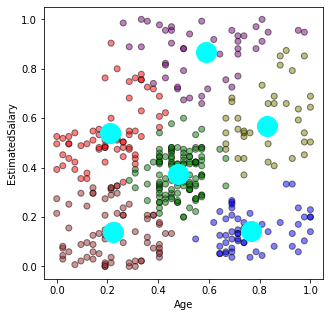

Iterasi : 10
Centroid : 
0.2091836734693877 0.5389417989417987
0.8308270676691727 0.5916179337231968
0.4798534798534797 0.3753719531497311
0.22285714285714284 0.13837037037037037
0.576086956521739 0.8663446054750403
0.7707231040564373 0.14526748971193418


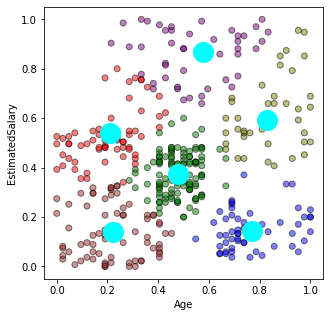

Iterasi : 11
Centroid : 
0.20469083155650322 0.5272526257600885
0.8400488400488398 0.6157644824311491
0.4798534798534797 0.3753719531497311
0.22285714285714284 0.13837037037037037
0.5425531914893617 0.8584712371946416
0.7701298701298701 0.1493602693602693


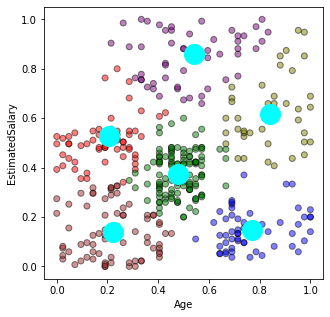

Iterasi : 12
Centroid : 
0.19162826420890935 0.50752688172043
0.8406593406593404 0.6222222222222222
0.48224374495560923 0.3776522284996863
0.22285714285714284 0.13837037037037037
0.5205415499533147 0.8492374727668847
0.7701298701298701 0.1493602693602693


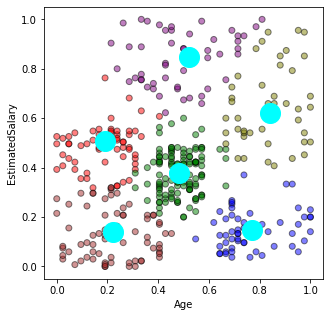

Iterasi : 13
Centroid : 
0.1878306878306878 0.485949441504997
0.8355481727574746 0.6459948320413436
0.48392348392348383 0.37790440012662246
0.22354497354497355 0.13065843621399176
0.487142857142857 0.8394074074074075
0.7701298701298701 0.1493602693602693


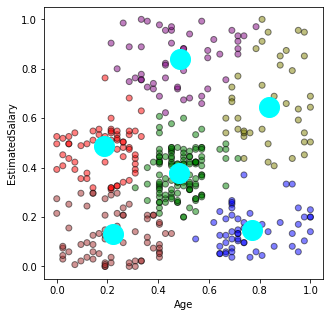

Iterasi : 14
Centroid : 
0.18759018759018756 0.4747474747474747
0.8418367346938771 0.6629629629629629
0.4881952781112444 0.381325863678805
0.22394755003450662 0.12259796027911969
0.48056365403304163 0.8361300075585791
0.7701298701298701 0.1493602693602693


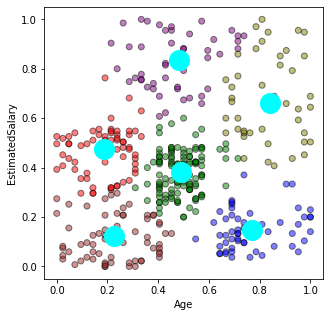

Iterasi : 15
Centroid : 
0.18495514147688058 0.46698872785829304
0.8338624338624336 0.6762139917695472
0.4889023405972558 0.3794099183929695
0.2283549783549784 0.11470258136924802
0.4635258358662612 0.8296296296296296
0.7701298701298701 0.1493602693602693


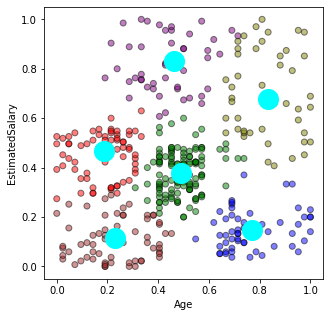

Iterasi : 16
Centroid : 
0.1815044858523119 0.454320987654321
0.8287740628166156 0.6961386918833726
0.49099639855942373 0.37989417989418006
0.2317708333333334 0.109375
0.43685300207039324 0.8198067632850242
0.7701298701298701 0.1493602693602693


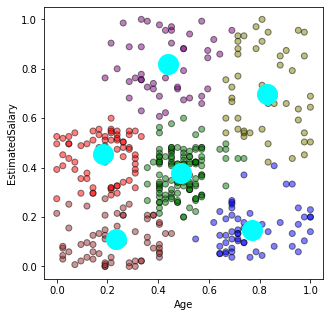

Iterasi : 17
Centroid : 
0.18163265306122445 0.4475132275132276
0.8257345491388042 0.7073286052009456
0.49253430185633573 0.38041431261770264
0.2320483749055178 0.10652557319223985
0.42857142857142844 0.8132045088566828
0.7716836734693878 0.15396825396825392


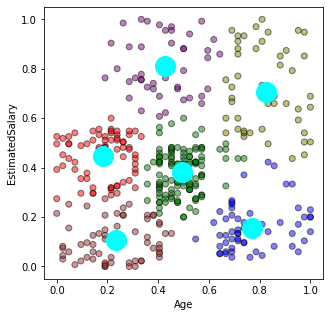

Iterasi : 18
Centroid : 
0.18163265306122445 0.4475132275132276
0.8226950354609925 0.7186761229314422
0.49253430185633573 0.38041431261770264
0.2320483749055178 0.10652557319223985
0.4227513227513227 0.8100411522633746
0.7727652464494569 0.15867446393762177


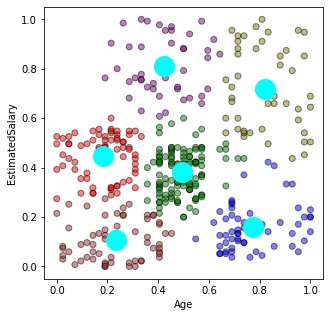

Iterasi : 1
Centroid : 
0.4193121693121694 0.49176954732510286
0.7317927170868345 0.4418300653594771
0.46445824706694255 0.3410628019323671
0.1418650793650793 0.41574074074074074
0.5794930875576036 0.8420549581839906
0.5820105820105822 0.10020576131687242
0.25091575091575097 0.2670465337132004


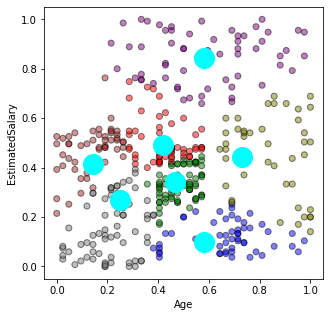

Iterasi : 2
Centroid : 
0.42328042328042337 0.5048010973936901
0.8391534391534388 0.44888888888888895
0.4861111111111111 0.3311728395061728
0.13809523809523808 0.4717037037037036
0.5837301587301587 0.8479012345679012
0.6693620844564241 0.12019566736547867
0.21464646464646467 0.15252525252525254


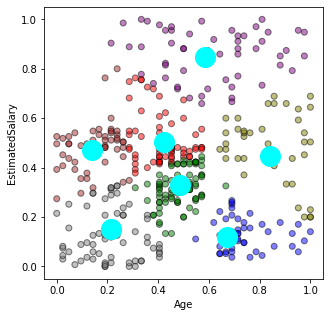

Iterasi : 3
Centroid : 
0.415873015873016 0.5162962962962963
0.8431013431013429 0.48357075023741686
0.4819976771196284 0.31779584462511284
0.14985994397759103 0.4824981844589688
0.6056277056277056 0.856835016835017
0.741641337386018 0.13002364066193853
0.21248196248196244 0.1281705948372615


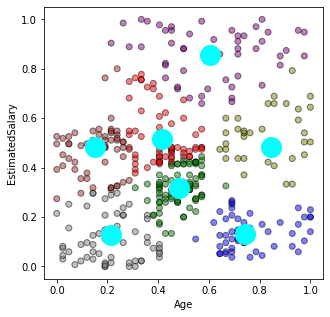

Iterasi : 4
Centroid : 
0.41608118657299 0.5249544626593805
0.8251700680272107 0.531005291005291
0.4819976771196284 0.31779584462511284
0.1577380952380952 0.470899470899471
0.6089743589743589 0.8618233618233622
0.76510989010989 0.13803418803418804
0.21159754224270355 0.11565113500597375


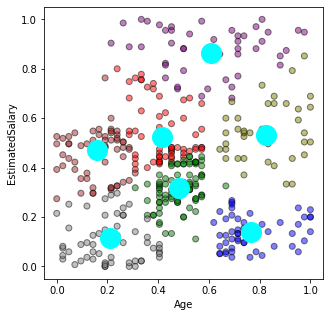

Iterasi : 5
Centroid : 
0.4172719935431801 0.5422473320778405
0.8251879699248118 0.5483430799220272
0.4819376026272578 0.3182630906768837
0.16150793650793646 0.4555555555555555
0.5977710233029382 0.8770685579196219
0.7693744164332399 0.13856209150326798
0.2114121510673235 0.10446998722860794


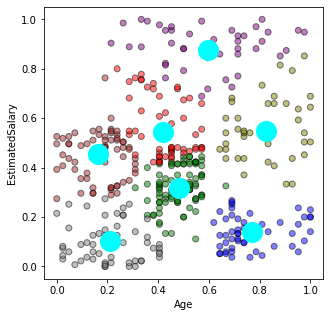

Iterasi : 6
Centroid : 
0.42510822510822516 0.5624242424242424
0.8232142857142855 0.5583333333333332
0.47989417989418 0.32164609053497933
0.1703296703296703 0.44866096866096866
0.5946843853820597 0.8902670111972438
0.7693744164332399 0.13856209150326798
0.2108843537414966 0.09775132275132277


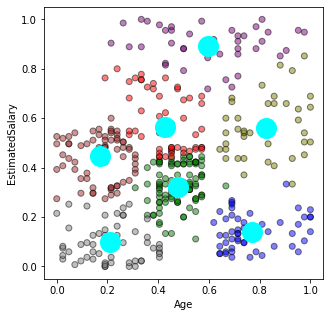

Iterasi : 7
Centroid : 
0.42719780219780223 0.5877492877492878
0.8211233211233208 0.564102564102564
0.4761904761904763 0.32717348927875234
0.17243867243867242 0.44130190796857466
0.5993031358885017 0.8982836495031616
0.7719780219780219 0.14230769230769233
0.21125541125541125 0.09454545454545454


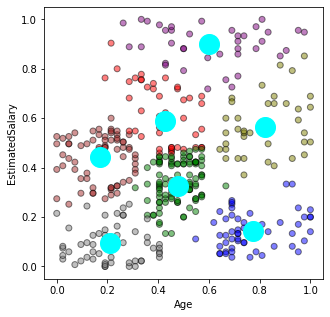

Iterasi : 8
Centroid : 
0.4161255411255411 0.6200336700336702
0.8182957393483707 0.5701754385964911
0.47572362278244634 0.33943355119825697
0.17226890756302518 0.4398692810457516
0.6089285714285714 0.8981481481481483
0.7707231040564373 0.14526748971193418
0.21428571428571427 0.09163237311385457


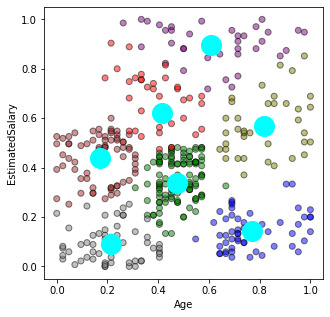

Iterasi : 9
Centroid : 
0.3944658944658945 0.6682682682682684
0.8182957393483707 0.5701754385964911
0.47704847704847697 0.3502836169502836
0.17226890756302518 0.4398692810457516
0.6221804511278195 0.9005847953216374
0.7707231040564373 0.14526748971193418
0.21428571428571427 0.09163237311385457


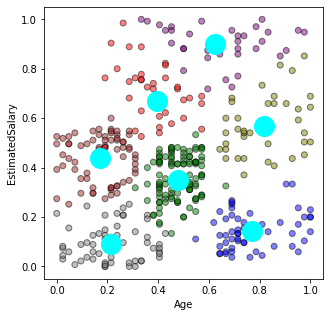

Iterasi : 10
Centroid : 
0.3850340136054422 0.7115343915343916
0.8182957393483707 0.5701754385964911
0.47808680994521685 0.35850540806293013
0.17391304347826084 0.4414385399892647
0.6462585034013605 0.9007407407407407
0.7707231040564373 0.14526748971193418
0.22066326530612246 0.09444444444444443


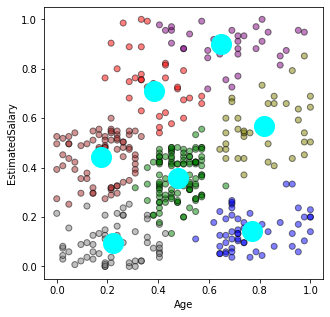

Iterasi : 11
Centroid : 
0.3843537414965986 0.7445502645502646
0.8166023166023164 0.5635635635635635
0.4795617361989042 0.36191412651589644
0.1780684104627766 0.444131455399061
0.676046176046176 0.8956228956228957
0.7707231040564373 0.14526748971193418
0.22389306599832917 0.09577647823261858


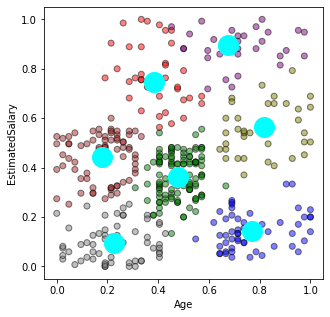

Iterasi : 12
Centroid : 
0.38909774436090233 0.7713450292397661
0.8121693121693121 0.5555555555555556
0.4795617361989042 0.3651261881350378
0.1780684104627766 0.444131455399061
0.7182539682539681 0.8871604938271603
0.7707231040564373 0.14526748971193418
0.2270114942528736 0.09719029374201789


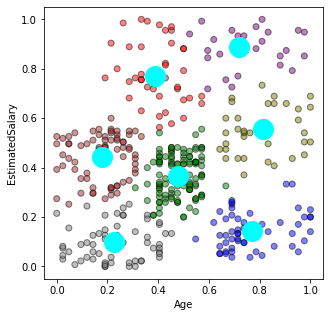

Iterasi : 13
Centroid : 
0.3960511033681766 0.7815718157181574
0.808843537414966 0.5487830687830688
0.4798044217687073 0.3671957671957672
0.1780684104627766 0.444131455399061
0.7508503401360543 0.8812169312169312
0.7707231040564373 0.14526748971193418
0.2308313155770783 0.09780288763339612


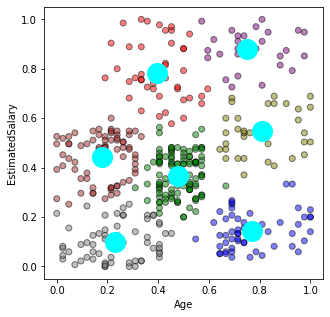

Iterasi : 14
Centroid : 
0.4036281179138322 0.7890652557319225
0.8088235294117646 0.543355119825708
0.48090948090948077 0.37183850517183853
0.1780684104627766 0.444131455399061
0.7671957671957671 0.8795610425240054
0.7707231040564373 0.14526748971193418
0.23575331772053087 0.10139647844565877


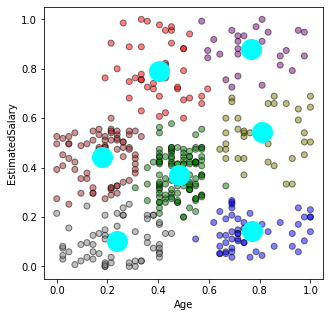

Iterasi : 15
Centroid : 
0.4024390243902439 0.7942186088527554
0.8148148148148147 0.531687242798354
0.4806547619047618 0.3736772486772488
0.1780684104627766 0.444131455399061
0.7671957671957671 0.8795610425240054
0.76510989010989 0.13803418803418804
0.23575331772053087 0.10139647844565877


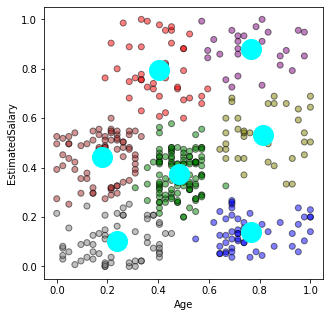

Iterasi : 1
Centroid : 
0.4115646258503402 0.4603174603174604
0.7768959435626098 0.4367626886145403
0.4553049289891394 0.31968810916179335
0.1418650793650793 0.41574074074074074
0.5809523809523809 0.8479012345679013
0.5820105820105822 0.10020576131687242
0.25091575091575097 0.2670465337132004
0.5238095238095237 0.4847222222222223


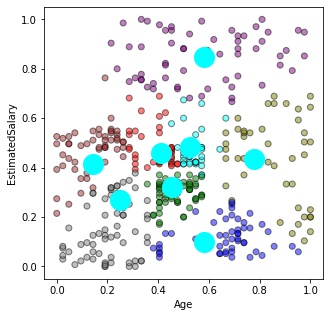

Iterasi : 2
Centroid : 
0.38928571428571435 0.48092592592592587
0.8560606060606059 0.4341750841750842
0.46950710108604843 0.29447693307342443
0.13809523809523808 0.4717037037037036
0.5733801717408274 0.848087431693989
0.6652380952380953 0.11985185185185186
0.20786092214663646 0.14697236919459145
0.5414965986394558 0.4715343915343917


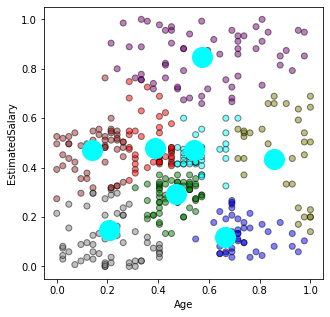

Iterasi : 3
Centroid : 
0.3792912513842747 0.4926787252368648
0.8865546218487393 0.4572984749455338
0.4603174603174603 0.2840681951793063
0.151392632524708 0.46694619147449334
0.5804059328649491 0.8457802064359442
0.7312169312169311 0.12888888888888886
0.20674603174603176 0.11283950617283955
0.5609756097560976 0.4551038843721772


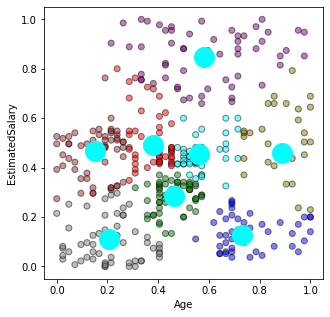

Iterasi : 4
Centroid : 
0.37474120082815743 0.5101449275362319
0.8826530612244897 0.5156084656084656
0.4578454332552693 0.2814814814814815
0.15221088435374147 0.45806878306878307
0.5885547201336674 0.851202079272255
0.7566666666666664 0.13422222222222221
0.20885547201336677 0.10292397660818715
0.5666666666666665 0.45283950617283963


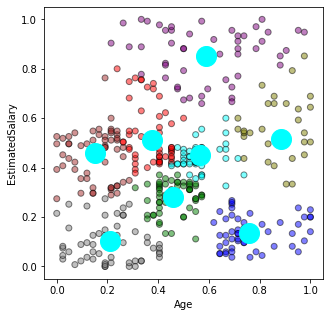

Iterasi : 5
Centroid : 
0.3697764820213801 0.5337868480725624
0.8702791461412149 0.5634738186462324
0.4592933947772658 0.2787335722819594
0.15329991645781116 0.44873294346978554
0.5906593406593406 0.8592592592592594
0.7693744164332399 0.13856209150326798
0.20822510822510823 0.09602693602693604
0.5603174603174604 0.440329218106996


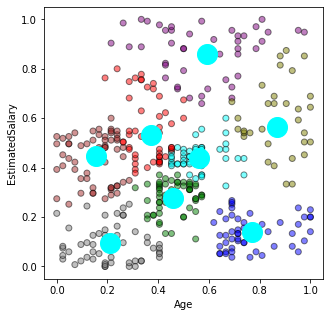

Iterasi : 6
Centroid : 
0.36111111111111116 0.5543209876543209
0.8705357142857141 0.5972222222222222
0.4592933947772658 0.2787335722819594
0.15147783251231522 0.43690932311621966
0.5766045548654243 0.8700483091787442
0.7693744164332399 0.13856209150326798
0.21159029649595687 0.08972746331236896
0.5552380952380954 0.4402962962962963


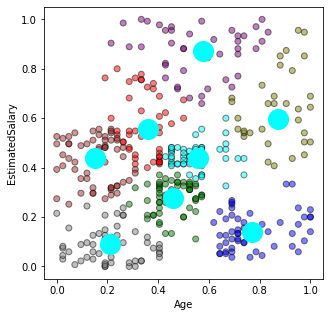

Iterasi : 7
Centroid : 
0.3446969696969698 0.572053872053872
0.8679653679653676 0.6372615039281707
0.45653817082388504 0.27830687830687834
0.15288220551378442 0.42858999350227417
0.555924695459579 0.870628768303187
0.774932614555256 0.14591194968553461
0.21016483516483514 0.0866096866096866
0.5454545454545456 0.4429629629629629


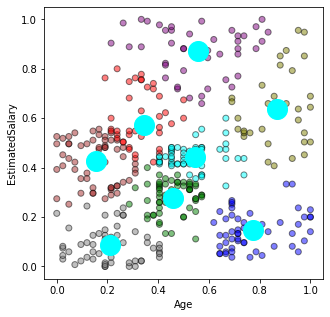

Iterasi : 8
Centroid : 
0.3266178266178266 0.6000000000000001
0.8679653679653676 0.6372615039281707
0.454985119047619 0.2802083333333334
0.1519480519480519 0.42222222222222217
0.555924695459579 0.870628768303187
0.774932614555256 0.14591194968553461
0.21016483516483514 0.0866096866096866
0.5316159250585482 0.4416514875531269


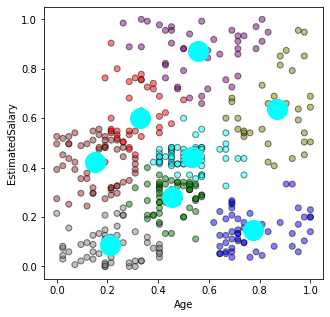

Iterasi : 9
Centroid : 
0.31018518518518523 0.6236625514403292
0.8620448179271706 0.636165577342048
0.4546485260770975 0.278777189888301
0.1530612244897959 0.41719576719576723
0.5640589569160996 0.8698412698412697
0.774932614555256 0.14591194968553461
0.21195144724556492 0.08351488743645605
0.5219780219780221 0.441025641025641


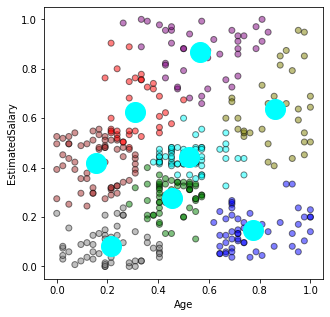

Iterasi : 10
Centroid : 
0.31020408163265306 0.6404232804232804
0.8620448179271706 0.636165577342048
0.4546485260770975 0.278777189888301
0.15804597701149425 0.41877394636015325
0.5708478513356561 0.8693766937669375
0.774932614555256 0.14591194968553461
0.21195144724556492 0.08351488743645605
0.5219780219780221 0.441025641025641


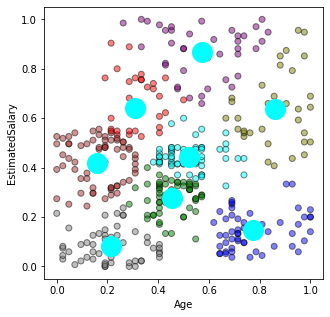

Iterasi : 11
Centroid : 
0.319047619047619 0.668395061728395
0.8620448179271706 0.636165577342048
0.4546485260770975 0.278777189888301
0.1655328798185941 0.4259847148736038
0.5744047619047618 0.8720370370370368
0.774932614555256 0.14591194968553461
0.21195144724556492 0.08351488743645605
0.520923520923521 0.4430976430976431


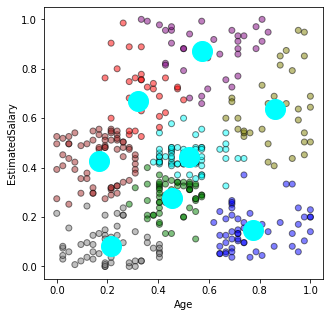

Iterasi : 12
Centroid : 
0.3382594417077176 0.7118773946360153
0.8620448179271706 0.636165577342048
0.4546485260770975 0.278777189888301
0.1699134199134199 0.43602693602693604
0.5952380952380952 0.8767489711934154
0.7742504409171075 0.15006858710562412
0.21016483516483514 0.0866096866096866
0.515873015873016 0.445679012345679


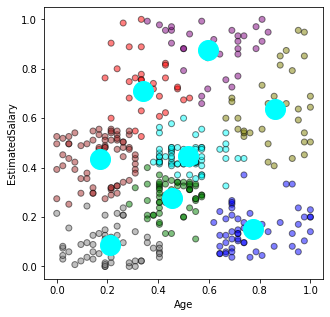

Iterasi : 13
Centroid : 
0.35158730158730156 0.7439506172839505
0.8620448179271706 0.636165577342048
0.4546485260770975 0.278777189888301
0.17331932773109243 0.4391067538126362
0.6160714285714286 0.8826388888888888
0.7742504409171075 0.15006858710562412
0.21016483516483514 0.0866096866096866
0.5142146410803128 0.44742951907131007


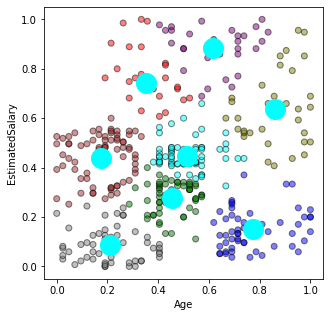

Iterasi : 14
Centroid : 
0.358843537414966 0.7727513227513227
0.8620448179271706 0.636165577342048
0.4546485260770975 0.278777189888301
0.1780684104627766 0.444131455399061
0.6261904761904762 0.8864197530864196
0.7742504409171075 0.15006858710562412
0.21016483516483514 0.0866096866096866
0.5150560224089636 0.4505446623093681


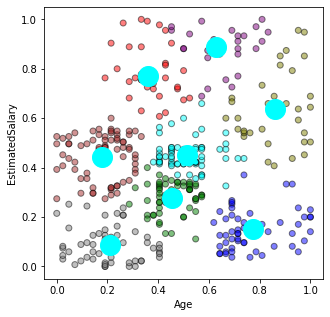

Iterasi : 15
Centroid : 
0.3697916666666667 0.7895833333333333
0.8620448179271706 0.636165577342048
0.4546485260770975 0.278777189888301
0.17993197278911563 0.44687830687830693
0.6538461538461537 0.8831908831908831
0.7742504409171075 0.15006858710562412
0.20709793351302783 0.08972746331236896
0.5150560224089636 0.4505446623093681


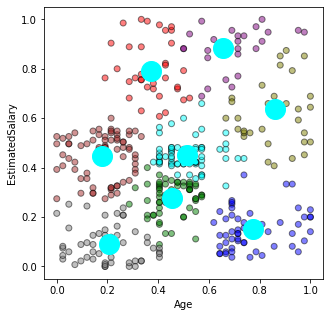

Iterasi : 16
Centroid : 
0.3746498599439776 0.7997821350762527
0.8556547619047616 0.6164351851851853
0.4538690476190476 0.27581018518518524
0.17993197278911563 0.44687830687830693
0.693223443223443 0.8823361823361822
0.7742504409171075 0.15006858710562412
0.2032967032967033 0.08974358974358972
0.5150560224089636 0.4505446623093681


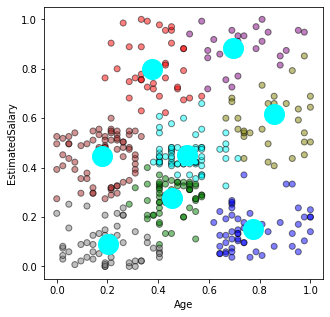

Iterasi : 17
Centroid : 
0.3862433862433863 0.8065843621399178
0.8484126984126982 0.5874074074074074
0.4538690476190476 0.27581018518518524
0.17993197278911563 0.44687830687830693
0.7353479853479853 0.8857549857549856
0.7742504409171075 0.15006858710562412
0.2032967032967033 0.08974358974358972
0.5101540616246499 0.45305010893246184


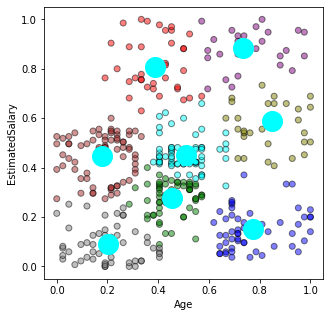

Iterasi : 18
Centroid : 
0.3888888888888889 0.8154320987654322
0.8366174055829227 0.5660280970625798
0.4538690476190476 0.27581018518518524
0.17993197278911563 0.44687830687830693
0.7592592592592591 0.8790123456790122
0.7742504409171075 0.15006858710562412
0.2032967032967033 0.08974358974358972
0.5059523809523809 0.4557734204793028


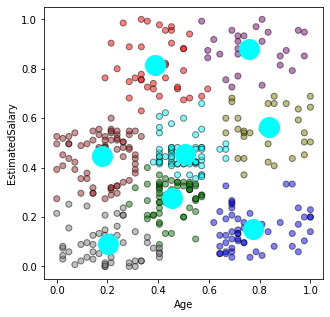

Iterasi : 19
Centroid : 
0.3944658944658945 0.8128128128128129
0.8285714285714285 0.5530864197530864
0.4538690476190476 0.27581018518518524
0.17993197278911563 0.44687830687830693
0.7671957671957671 0.8795610425240054
0.7729276895943562 0.1492455418381344
0.2032967032967033 0.08974358974358972
0.5010822510822511 0.4564534231200898


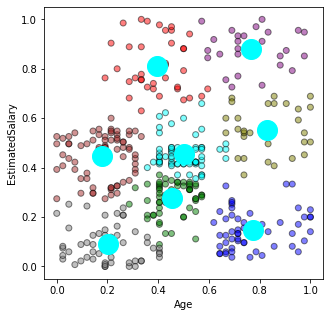

Iterasi : 20
Centroid : 
0.3944658944658945 0.8128128128128129
0.8285714285714285 0.5530864197530864
0.45540438397581245 0.27383891828336276
0.17993197278911563 0.44687830687830693
0.7671957671957671 0.8795610425240054
0.7729276895943562 0.1492455418381344
0.2032967032967033 0.08974358974358972
0.4989339019189767 0.45561083471531233


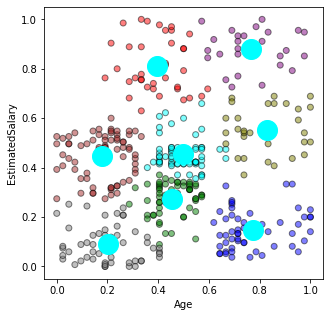

Iterasi : 21
Centroid : 
0.3944658944658945 0.8128128128128129
0.8233486943164362 0.5512544802867383
0.45540438397581245 0.27383891828336276
0.17993197278911563 0.44687830687830693
0.7671957671957671 0.8795610425240054
0.7729276895943562 0.1492455418381344
0.2032967032967033 0.08974358974358972
0.49639249639249655 0.45499438832772165


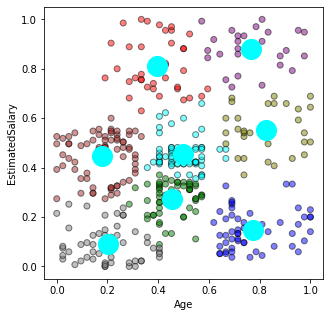

Iterasi : 1
Centroid : 
0.4115646258503402 0.4603174603174604
0.7768959435626098 0.4367626886145403
0.4618149146451031 0.32844164919636615
0.16666666666666666 0.5225308641975309
0.5809523809523809 0.8479012345679013
0.6537530266343826 0.11073446327683614
0.3160173160173159 0.43973063973063975
0.5238095238095237 0.4847222222222223
0.19323671497584538 0.17283950617283947


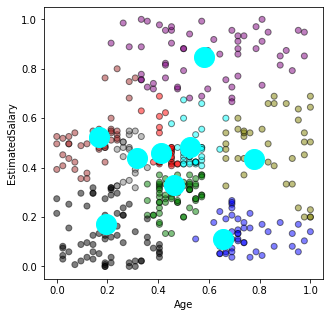

Iterasi : 2
Centroid : 
0.425170068027211 0.4767195767195767
0.8483709273182957 0.4766081871345028
0.4694940476190476 0.2888888888888889
0.14664502164502166 0.5185185185185186
0.5886699507389161 0.8521072796934867
0.741641337386018 0.13002364066193853
0.28679653679653677 0.4387205387205388
0.5396825396825395 0.4776655443322111
0.20346320346320343 0.1286195286195286


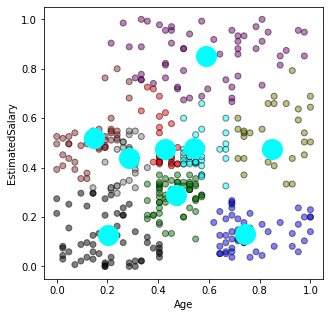

Iterasi : 3
Centroid : 
0.42410714285714296 0.49537037037037035
0.8587848932676517 0.536653895274585
0.46409674981103555 0.28077601410934744
0.13937282229965162 0.515085817524842
0.5839598997493735 0.8530214424951268
0.7693744164332399 0.13856209150326798
0.26765188834154346 0.4189016602809707
0.5639097744360902 0.4580896686159846
0.20079365079365083 0.11222222222222225


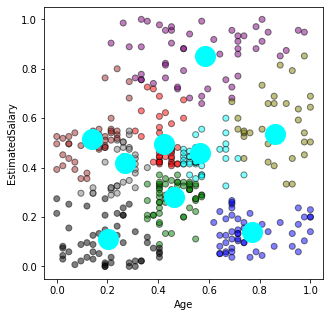

Iterasi : 4
Centroid : 
0.4226190476190477 0.5055555555555554
0.8648233486943162 0.5749103942652328
0.4608294930875575 0.27502986857825573
0.13937282229965162 0.515085817524842
0.5660377358490566 0.8592592592592596
0.7693744164332399 0.13856209150326798
0.24884792626728103 0.39522102747909205
0.5720238095238096 0.4420370370370373
0.20086580086580083 0.09939393939393941


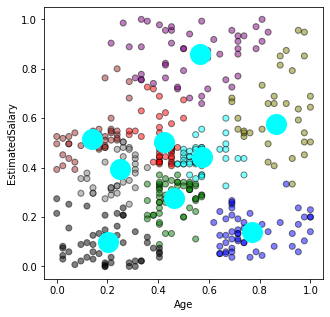

Iterasi : 5
Centroid : 
0.41203703703703715 0.5125514403292181
0.8697478991596634 0.628322440087146
0.4608294930875575 0.27502986857825573
0.14407814407814415 0.5266856600189933
0.5332341269841269 0.8589506172839511
0.7719780219780219 0.14230769230769233
0.23376623376623368 0.3719416386083053
0.5714285714285715 0.44065460809646867
0.19946091644204852 0.09322152341020265


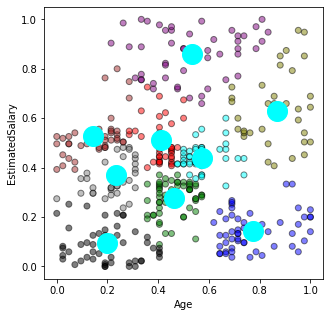

Iterasi : 6
Centroid : 
0.41137566137566145 0.5037037037037035
0.8627450980392153 0.6398692810457517
0.4608294930875575 0.27502986857825573
0.14982578397212545 0.5255645889792232
0.5267857142857142 0.8587962962962966
0.774932614555256 0.14591194968553461
0.22172619047619038 0.3555555555555556
0.5714285714285715 0.44065460809646867
0.20214752567693742 0.08685548293391429


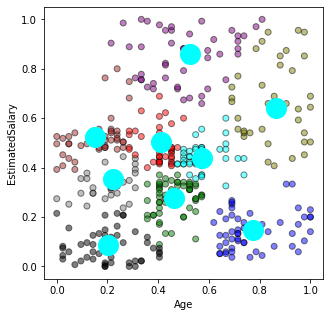

Iterasi : 7
Centroid : 
0.40090090090090097 0.49029029029029025
0.8546365914786965 0.6649122807017543
0.4608294930875575 0.27502986857825573
0.15448504983388706 0.5233419465977606
0.49999999999999983 0.8502415458937199
0.774932614555256 0.14591194968553461
0.202791461412151 0.32796934865900385
0.5714285714285715 0.44065460809646867
0.20699708454810495 0.08027210884353739


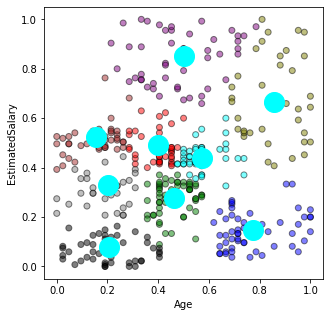

Iterasi : 8
Centroid : 
0.39598997493734345 0.48167641325536054
0.8534798534798532 0.6735042735042734
0.4608294930875575 0.27502986857825573
0.15119047619047624 0.5140740740740741
0.4816468253968253 0.8405864197530866
0.774932614555256 0.14591194968553461
0.1904761904761904 0.3061728395061728
0.5714285714285715 0.44065460809646867
0.20887445887445885 0.06548821548821547


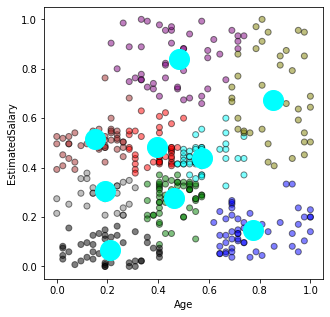

Iterasi : 9
Centroid : 
0.3916666666666667 0.4768518518518518
0.8511904761904759 0.6892592592592591
0.4608294930875575 0.27502986857825573
0.15282392026578073 0.5074935400516796
0.46997929606625244 0.8373590982286635
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.5752164502164503 0.4425925925925927
0.20887445887445885 0.06548821548821547


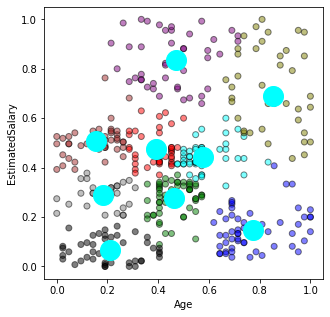

Iterasi : 10
Centroid : 
0.39198606271777015 0.47425474254742545
0.8440476190476188 0.7188888888888889
0.46174863387978143 0.2734669095324833
0.15282392026578073 0.5074935400516796
0.4534883720930232 0.8360034453057709
0.7764550264550264 0.15075445816186558
0.18367346938775506 0.2883597883597883
0.5838509316770186 0.44460547504025777
0.20887445887445885 0.06548821548821547


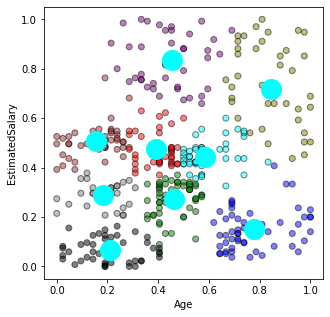

Iterasi : 11
Centroid : 
0.3959025470653378 0.47149009474590875
0.8428571428571427 0.7377777777777778
0.46174863387978143 0.2734669095324833
0.15282392026578073 0.5074935400516796
0.4407665505226481 0.8317976513098464
0.7764550264550264 0.15075445816186558
0.18367346938775506 0.2883597883597883
0.5952380952380952 0.45024154589372
0.20887445887445885 0.06548821548821547


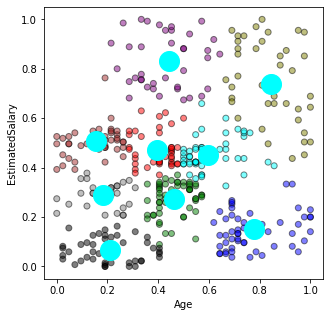

Iterasi : 12
Centroid : 
0.3959025470653378 0.47149009474590875
0.8410714285714285 0.7481481481481482
0.46174863387978143 0.2734669095324833
0.14965986394557826 0.5033509700176366
0.4273809523809525 0.8292592592592593
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.6034985422740525 0.45547996976568417
0.20887445887445885 0.06548821548821547


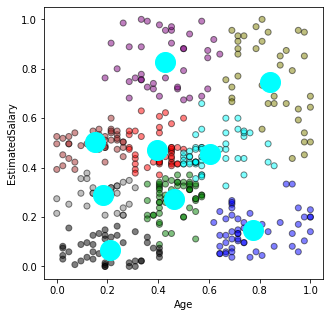

Iterasi : 13
Centroid : 
0.3982683982683983 0.4715488215488216
0.8446115288220551 0.7586744639376217
0.46274961597542247 0.27502986857825573
0.148664343786295 0.49701897018970176
0.42160278745644597 0.8276422764227641
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.6141885325558797 0.46061980347694637
0.20887445887445885 0.06548821548821547


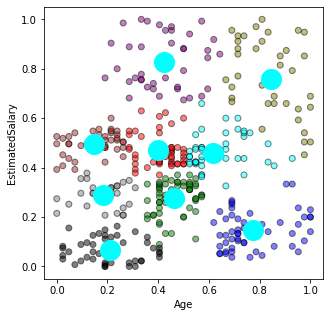

Iterasi : 14
Centroid : 
0.40864917395529643 0.4675736961451247
0.8423423423423423 0.7673673673673672
0.46409674981103555 0.27630805408583187
0.148664343786295 0.49701897018970176
0.42160278745644597 0.8276422764227641
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.635822510822511 0.46565656565656577
0.20887445887445885 0.06548821548821547


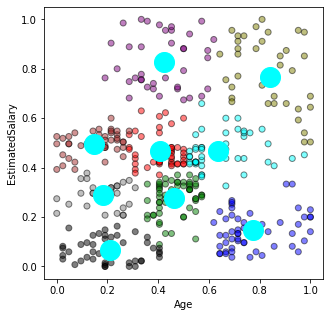

Iterasi : 15
Centroid : 
0.4112103174603175 0.46589506172839507
0.833994708994709 0.7845679012345679
0.46409674981103555 0.27630805408583187
0.15192743764172337 0.49823633156966485
0.41607142857142865 0.826851851851852
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.6469979296066254 0.4673107890499196
0.20887445887445885 0.06548821548821547


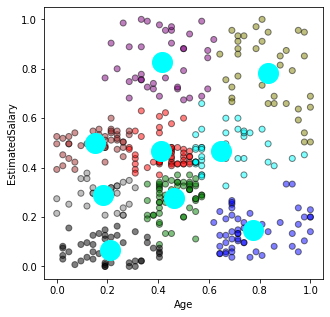

Iterasi : 16
Centroid : 
0.4244505494505495 0.461965811965812
0.833994708994709 0.7845679012345679
0.46409674981103555 0.27630805408583187
0.15503875968992248 0.49905254091300594
0.41607142857142865 0.826851851851852
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.6620209059233451 0.47082204155374896
0.20887445887445885 0.06548821548821547


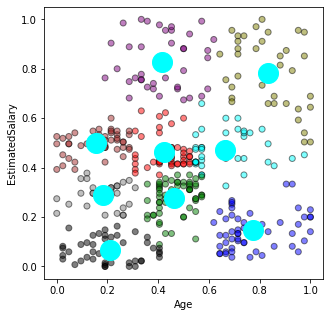

Iterasi : 17
Centroid : 
0.43000000000000005 0.4613333333333333
0.833994708994709 0.7845679012345679
0.4657738095238096 0.27766203703703707
0.16084656084656085 0.49810699588477375
0.41607142857142865 0.826851851851852
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.6642857142857144 0.47351851851851856
0.20887445887445885 0.06548821548821547


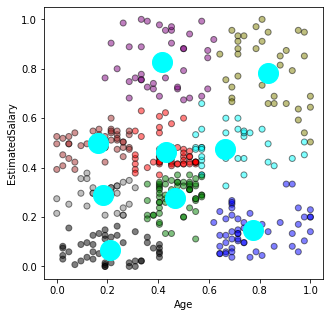

Iterasi : 18
Centroid : 
0.4406926406926407 0.4576430976430976
0.8299319727891157 0.7925925925925925
0.4667422524565381 0.2806584362139918
0.16084656084656085 0.49810699588477375
0.41607142857142865 0.826851851851852
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.6891534391534394 0.48168724279835406
0.21322751322751318 0.06600823045267488


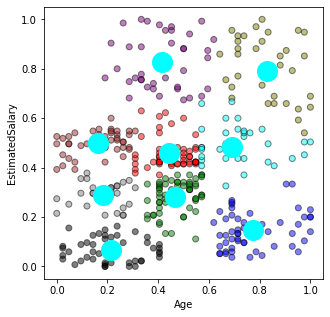

Iterasi : 19
Centroid : 
0.44862155388471175 0.4580896686159844
0.829004329004329 0.8051627384960717
0.46996336996336996 0.28341880341880343
0.1640786749482402 0.499194847020934
0.41607142857142865 0.826851851851852
0.774932614555256 0.14591194968553461
0.18367346938775506 0.2883597883597883
0.7186147186147186 0.49337822671156006
0.21322751322751318 0.06600823045267488


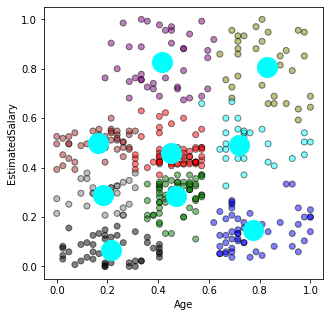

Iterasi : 20
Centroid : 
0.46447467876039317 0.460435038212816
0.8244047619047619 0.8134259259259259
0.46996336996336996 0.28341880341880343
0.1640786749482402 0.499194847020934
0.41607142857142865 0.826851851851852
0.774932614555256 0.14591194968553461
0.1880131362889983 0.29144316730523623
0.7663139329805996 0.5017832647462276
0.21322751322751318 0.06600823045267488


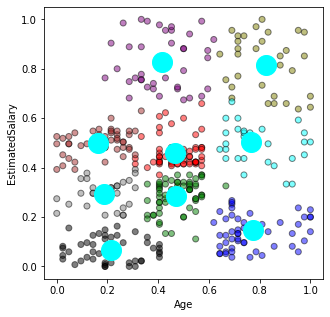

Iterasi : 21
Centroid : 
0.4734582357533179 0.4621736490588949
0.8202764976958524 0.8205495818399043
0.4729437229437229 0.2840628507295174
0.1706349206349206 0.5009259259259259
0.41607142857142865 0.826851851851852
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.7942176870748298 0.4936507936507936
0.21322751322751318 0.06600823045267488


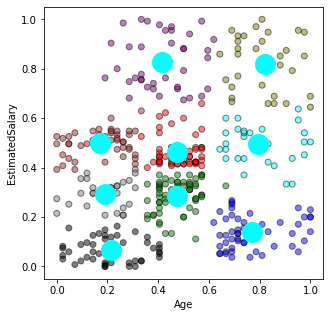

Iterasi : 22
Centroid : 
0.48029556650246313 0.4650063856960409
0.8118279569892471 0.8215053763440858
0.47192608386638235 0.28535102266445556
0.17619047619047612 0.497925925925926
0.41607142857142865 0.826851851851852
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8035714285714285 0.4925925925925926
0.21322751322751318 0.06600823045267488


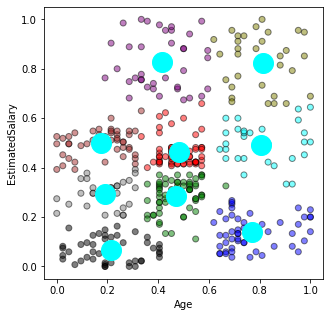

Iterasi : 23
Centroid : 
0.48029556650246313 0.4650063856960409
0.7995391705069123 0.8303464755077659
0.47192608386638235 0.28535102266445556
0.17619047619047612 0.497925925925926
0.4108669108669109 0.8245014245014246
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8103448275862067 0.4978288633461047
0.21322751322751318 0.06600823045267488


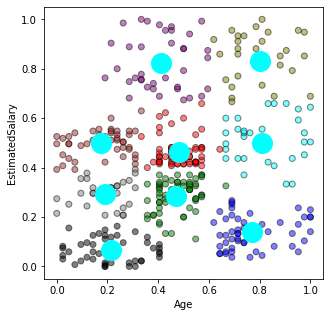

Iterasi : 24
Centroid : 
0.4830508474576272 0.4651600753295669
0.792517006802721 0.8486772486772486
0.47192608386638235 0.28535102266445556
0.17619047619047612 0.497925925925926
0.4108669108669109 0.8245014245014246
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8210445468509984 0.5142174432497013
0.21322751322751318 0.06600823045267488


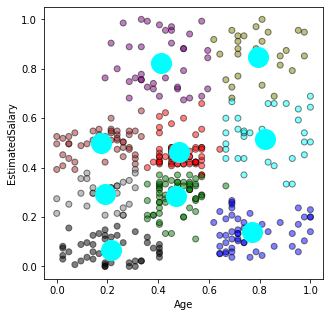

Iterasi : 25
Centroid : 
0.48849206349206364 0.46098765432098765
0.7884615384615384 0.8618233618233618
0.4688644688644689 0.2827350427350428
0.17927170868347334 0.498474945533769
0.4108669108669109 0.8245014245014246
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8225108225108224 0.5241301907968574
0.21322751322751318 0.06600823045267488


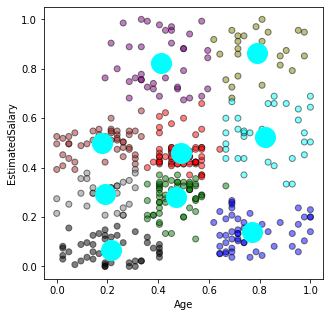

Iterasi : 26
Centroid : 
0.4903993855606761 0.45794504181600953
0.7857142857142857 0.8687407407407407
0.46636432350718066 0.28007054673721343
0.17927170868347334 0.498474945533769
0.4108669108669109 0.8245014245014246
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8235294117647057 0.5289760348583877
0.21322751322751318 0.06600823045267488


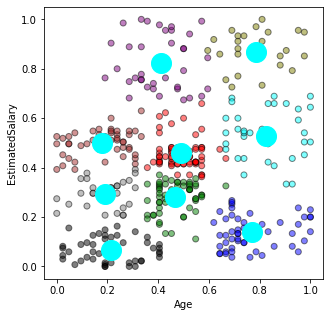

Iterasi : 27
Centroid : 
0.4929315476190478 0.45625
0.7819047619047619 0.8764444444444445
0.4662058371735791 0.2786140979689367
0.17927170868347334 0.498474945533769
0.406015037593985 0.823196881091618
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8242296918767505 0.536165577342048
0.21322751322751318 0.06600823045267488


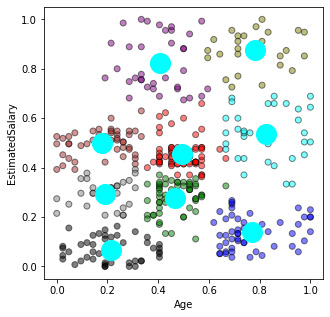

Iterasi : 28
Centroid : 
0.4929315476190478 0.45625
0.7747252747252747 0.8752136752136752
0.4662058371735791 0.2786140979689367
0.17927170868347334 0.498474945533769
0.4009009009009009 0.8226226226226228
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8242296918767505 0.536165577342048
0.21322751322751318 0.06600823045267488


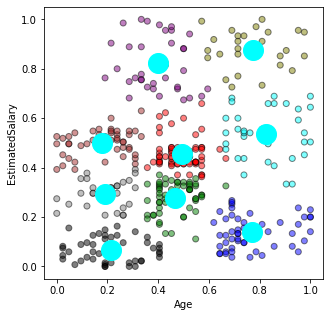

Iterasi : 29
Centroid : 
0.4929315476190478 0.45625
0.7671957671957671 0.8795610425240054
0.4662058371735791 0.2786140979689367
0.17927170868347334 0.498474945533769
0.39616402116402116 0.8179012345679013
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8242296918767505 0.536165577342048
0.21322751322751318 0.06600823045267488


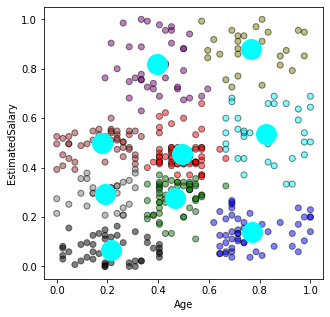

Iterasi : 30
Centroid : 
0.4929315476190478 0.45625
0.7671957671957671 0.8795610425240054
0.4662058371735791 0.2786140979689367
0.17619047619047612 0.4958518518518518
0.3944658944658945 0.8128128128128129
0.7693744164332399 0.13856209150326798
0.192063492063492 0.29481481481481475
0.8242296918767505 0.536165577342048
0.21322751322751318 0.06600823045267488


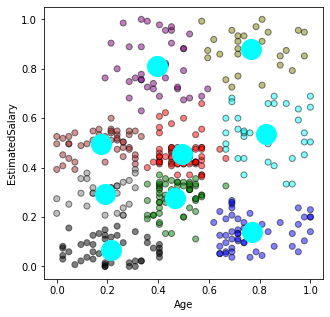

Iterasi : 1
Centroid : 
0.4115646258503402 0.4603174603174604
0.7988338192419822 0.45034013605442175
0.45548654244306425 0.3855072463768116
0.16666666666666666 0.5225308641975309
0.5809523809523809 0.8479012345679013
0.7332251082251081 0.1127946127946128
0.3160173160173159 0.43973063973063975
0.5238095238095237 0.4847222222222223
0.16297208538587846 0.17624521072796934
0.4426229508196722 0.21857923497267767


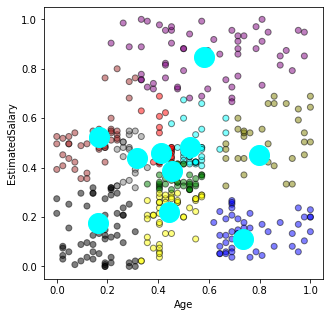

Iterasi : 2
Centroid : 
0.41718426501035205 0.49017713365539456
0.8325892857142856 0.5157407407407407
0.4806949806949808 0.35275275275275275
0.14664502164502166 0.5185185185185186
0.5886699507389161 0.8521072796934867
0.7693744164332399 0.13856209150326798
0.28679653679653677 0.4387205387205388
0.5461309523809523 0.4835648148148149
0.16883116883116883 0.13912457912457912
0.4404761904761905 0.20193236714975843


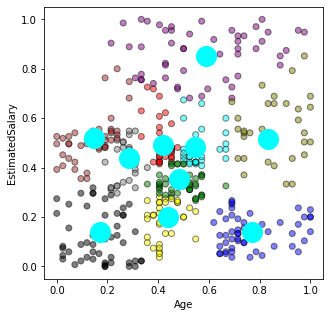

Iterasi : 3
Centroid : 
0.4141156462585035 0.5108465608465609
0.8556547619047616 0.5567129629629629
0.49028182701652095 0.3369614512471656
0.13937282229965162 0.515085817524842
0.5718778077268643 0.8621942697414399
0.7693744164332399 0.13856209150326798
0.26984126984126977 0.4186556927297669
0.562049062049062 0.47946127946127953
0.17115902964959567 0.12173305380852553
0.42496392496392504 0.18518518518518517


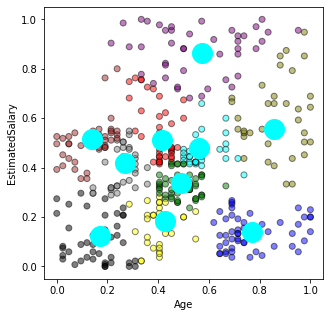

Iterasi : 4
Centroid : 
0.40145502645502656 0.5508230452674897
0.8646258503401357 0.6050793650793651
0.4907407407407406 0.32866941015089174
0.1318681318681319 0.5048433048433046
0.5555555555555554 0.8722633744855971
0.7693744164332399 0.13856209150326798
0.25729646697388625 0.3964157706093191
0.5757575757575758 0.4653198653198654
0.15925925925925927 0.10699588477366255
0.4016897081413212 0.16057347670250896


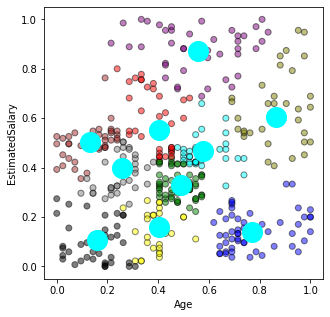

Iterasi : 5
Centroid : 
0.38822751322751325 0.5919753086419752
0.8679653679653676 0.6372615039281707
0.4813492063492062 0.33135802469135806
0.1322055137844612 0.5011695906432748
0.5563298490127757 0.8803974706413732
0.774932614555256 0.14591194968553461
0.24963924963924955 0.37261503928170603
0.5800264550264551 0.46111111111111136
0.15389082462253195 0.09719963866305326
0.39162561576354693 0.14559386973180075


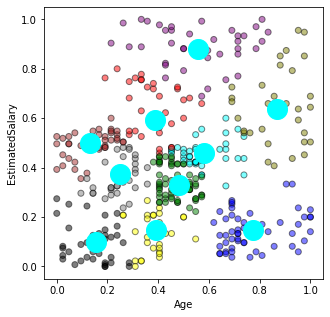

Iterasi : 6
Centroid : 
0.3824404761904762 0.6428240740740742
0.8712797619047616 0.6460648148148148
0.4700577200577199 0.3377104377104376
0.1373626373626374 0.4945868945868945
0.557017543859649 0.8927875243664717
0.774932614555256 0.14591194968553461
0.24500768049155136 0.35818399044205507
0.5776643990929706 0.4562610229276897
0.14411027568922308 0.09395711500974656
0.3834154351395732 0.13384418901660278


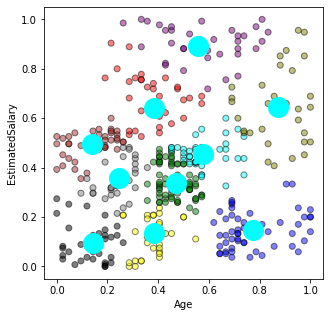

Iterasi : 7
Centroid : 
0.3757440476190476 0.6849537037037037
0.8712797619047616 0.6460648148148148
0.4632653061224489 0.3416931216931216
0.1398809523809524 0.494074074074074
0.5784313725490196 0.9023965141612199
0.774932614555256 0.14591194968553461
0.2412698412698412 0.35037037037037044
0.5746753246753248 0.45521885521885536
0.13333333333333336 0.09544973544973544
0.37777777777777793 0.12098765432098764


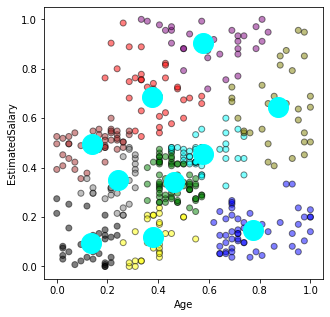

Iterasi : 8
Centroid : 
0.3795518207282913 0.7161220043572984
0.8712797619047616 0.6460648148148148
0.4617706237424547 0.34251434533124664
0.15043290043290045 0.49427609427609426
0.6071428571428571 0.905679012345679
0.774932614555256 0.14591194968553461
0.23973727422003274 0.33180076628352495
0.5746753246753248 0.45521885521885536
0.12955182072829133 0.09542483660130717
0.3817733990147784 0.11417624521072797


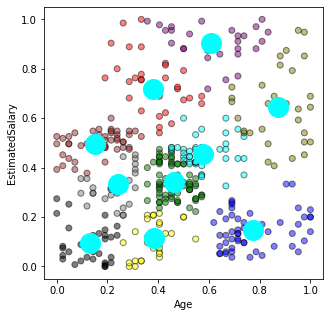

Iterasi : 9
Centroid : 
0.38167388167388167 0.7414141414141414
0.8712797619047616 0.6460648148148148
0.4609788359788359 0.3410493827160493
0.1646403242147923 0.49834515366430265
0.6207482993197277 0.9063492063492065
0.774932614555256 0.14591194968553461
0.22742200328407217 0.3195402298850575
0.5730158730158732 0.4584362139917697
0.12987012987012986 0.0909090909090909
0.380952380952381 0.10978835978835978


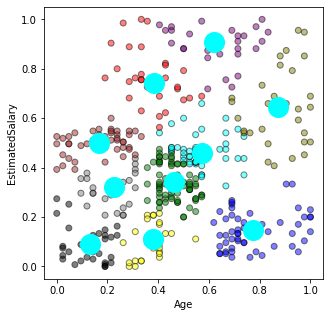

Iterasi : 10
Centroid : 
0.3717357910906298 0.7639187574671445
0.8771121351766511 0.6434886499402629
0.46203346203346185 0.33723723723723714
0.1706349206349206 0.4987654320987655
0.6326530612244897 0.896825396825397
0.774932614555256 0.14591194968553461
0.2183908045977011 0.3088122605363985
0.5669642857142858 0.46682098765432106
0.12797619047619047 0.08726851851851851
0.37179487179487186 0.10284900284900284


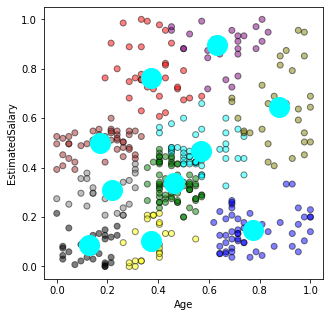

Iterasi : 11
Centroid : 
0.3759018759018759 0.7865319865319865
0.8771121351766511 0.6434886499402629
0.4610999329309188 0.33333333333333326
0.173469387755102 0.49750566893424025
0.6571428571428569 0.8909629629629628
0.774932614555256 0.14591194968553461
0.2023809523809523 0.30148148148148146
0.5590659340659342 0.46652421652421655
0.13492063492063494 0.07555555555555556
0.37179487179487186 0.10284900284900284


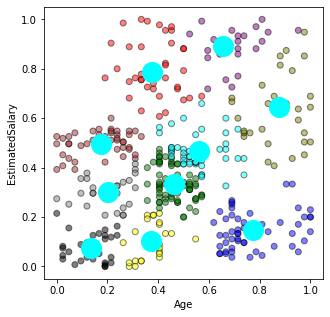

Iterasi : 12
Centroid : 
0.3867438867438868 0.8012012012012013
0.8701996927803377 0.6296296296296298
0.46122448979591824 0.3317460317460317
0.173469387755102 0.49750566893424025
0.7034632034632033 0.8882154882154881
0.774932614555256 0.14591194968553461
0.2023809523809523 0.30148148148148146
0.5535714285714287 0.46495726495726497
0.13492063492063494 0.07555555555555556
0.37179487179487186 0.10284900284900284


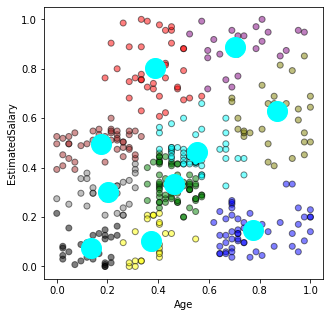

Iterasi : 13
Centroid : 
0.3867438867438868 0.8012012012012013
0.859605911330049 0.6
0.4621848739495798 0.3281045751633987
0.173469387755102 0.49750566893424025
0.7295238095238094 0.8885925925925926
0.774932614555256 0.14591194968553461
0.2023809523809523 0.30148148148148146
0.5458221024258763 0.46289308176100624
0.13492063492063494 0.07555555555555556
0.37179487179487186 0.10284900284900284


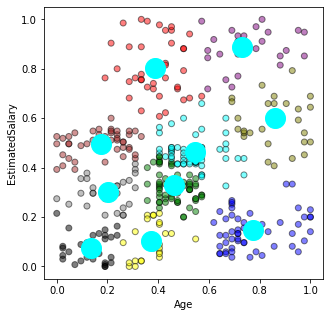

Iterasi : 14
Centroid : 
0.39035087719298245 0.8048732943469786
0.8544973544973543 0.582716049382716
0.46316964285714285 0.32152777777777775
0.173469387755102 0.49750566893424025
0.7527472527472525 0.8823361823361823
0.774932614555256 0.14591194968553461
0.2023809523809523 0.30148148148148146
0.5388471177944865 0.4608187134502924
0.13492063492063494 0.07555555555555556
0.37179487179487186 0.10284900284900284


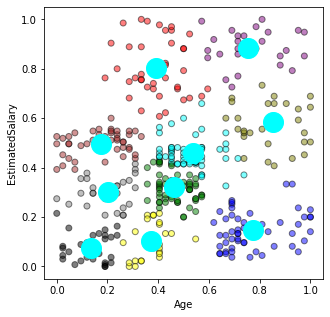

Iterasi : 15
Centroid : 
0.3956043956043956 0.802659069325736
0.840986394557823 0.5706349206349206
0.4652615144418422 0.3158469945355192
0.173469387755102 0.49750566893424025
0.7655677655677654 0.885185185185185
0.774932614555256 0.14591194968553461
0.2023809523809523 0.30148148148148146
0.5270935960591134 0.4575989782886334
0.13492063492063494 0.07555555555555556
0.37179487179487186 0.10284900284900284


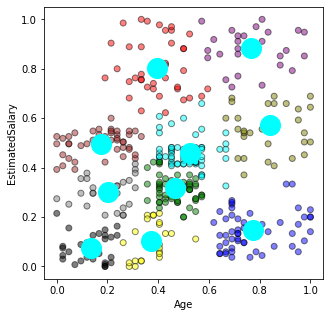

Iterasi : 16
Centroid : 
0.39536340852130325 0.8077972709551657
0.8341543513957306 0.5535121328224776
0.4667487684729063 0.3106002554278417
0.173469387755102 0.49750566893424025
0.7671957671957671 0.8795610425240054
0.774932614555256 0.14591194968553461
0.2023809523809523 0.30148148148148146
0.5138888888888891 0.45987654320987653
0.13492063492063494 0.07555555555555556
0.37179487179487186 0.10284900284900284


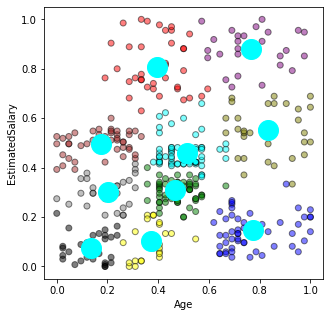

Iterasi : 17
Centroid : 
0.3944658944658945 0.8128128128128129
0.8317972350230414 0.5459976105137395
0.47406462585034 0.30132275132275144
0.173469387755102 0.49750566893424025
0.7671957671957671 0.8795610425240054
0.7719780219780219 0.14230769230769233
0.2023809523809523 0.30148148148148146
0.5003779289493576 0.46078777189888304
0.13492063492063494 0.07555555555555556
0.3704761904761905 0.09837037037037037


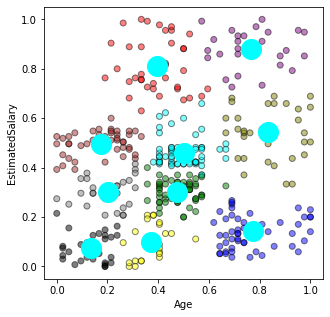

Iterasi : 18
Centroid : 
0.3944658944658945 0.8128128128128129
0.8340773809523808 0.5393518518518517
0.47577276524644935 0.3024041585445095
0.173469387755102 0.49750566893424025
0.7671957671957671 0.8795610425240054
0.7693744164332399 0.13856209150326798
0.2023809523809523 0.30148148148148146
0.49923195084485417 0.4623655913978495
0.13492063492063494 0.07555555555555556
0.3704761904761905 0.09837037037037037


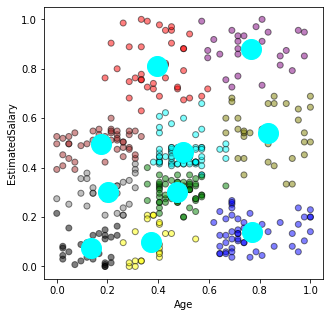

Banyak klaster 1, wcss= 50.30909586517734
Banyak klaster 2, wcss= 32.717212920632136
Banyak klaster 3, wcss= 24.127304711194732
Banyak klaster 4, wcss= 16.9715928079911
Banyak klaster 5, wcss= 11.614639419805268
Banyak klaster 6, wcss= 8.414965231315334
Banyak klaster 7, wcss= 7.102239243457216
Banyak klaster 8, wcss= 6.272132050327835
Banyak klaster 9, wcss= 5.69653706433826
Banyak klaster 10, wcss= 5.1908122503168395


In [35]:
wcss = []
for i in range(10):
  sna2, pusat = klaster(sna, att1, att2, i+1)
  wcss.append(eror_sse(sna2, pusat))

for i in range(len(wcss)):
  print('Banyak klaster {}, wcss= {}'.format(i+1, wcss[i]))

### Visualisasi Elbow

Text(0, 0.5, 'WCSS')

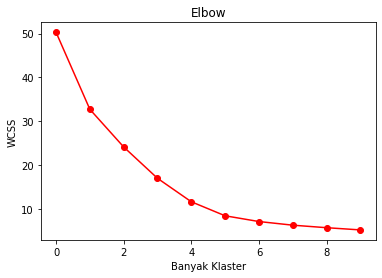

In [36]:
plt.plot(range(len(wcss)), wcss, '-ro')
plt.title('Elbow')
plt.xlabel('Banyak Klaster')
plt.ylabel('WCSS')

## Menggunakan 4 klaster
dari Elbow dapat dilihat setelah 4 maka penurunan wcss sudah tidak signifikan maka 4 merupakan klater paling optimum

Iterasi : 1
Centroid : 
0.3776190476190477 0.5008888888888889
0.7374338624338623 0.44315843621399165
0.42739273927392735 0.26006600660066004
0.18049886621315187 0.4483245149911816


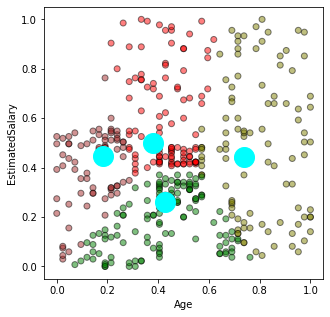

Iterasi : 2
Centroid : 
0.43210749646393226 0.6068940227356071
0.7911362564827911 0.4827282728272827
0.4216347956505436 0.18769320501603964
0.1421864520456069 0.3987480438184663


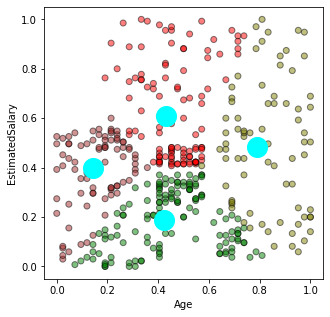

Iterasi : 3
Centroid : 
0.4664902998236331 0.635048010973937
0.8317460317460313 0.4905679012345678
0.45099061522419187 0.18702351987023516
0.15803571428571422 0.3899999999999999


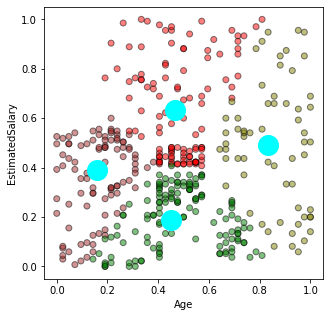

Iterasi : 4
Centroid : 
0.48219648219648215 0.6466466466466467
0.8548752834467116 0.490299823633157
0.48549946294307184 0.19537733221943743
0.16385048643113154 0.3607327757865393


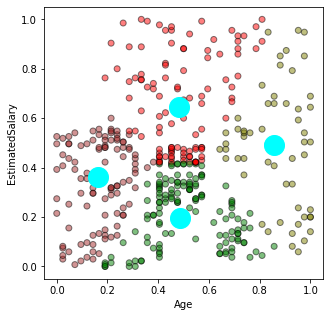

Iterasi : 5
Centroid : 
0.49079065588499554 0.670859538784067
0.8681972789115642 0.48584656084656075
0.5096288515406161 0.2137254901960784
0.169000933706816 0.3413217138707334


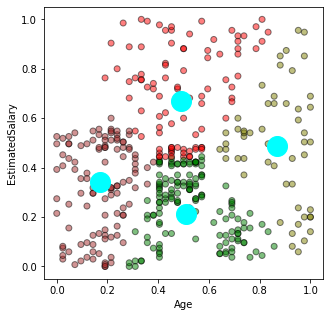

Iterasi : 6
Centroid : 
0.49564772145417313 0.7092791716447632
0.8706199460916436 0.4895877009084556
0.5288045288045288 0.24071484071484062
0.17417417417417413 0.323123123123123


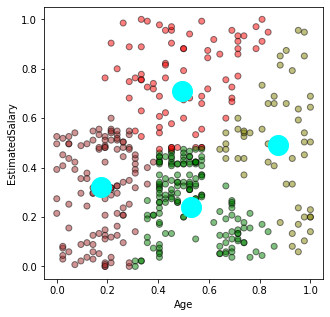

Iterasi : 7
Centroid : 
0.4987789987789988 0.7579297245963914
0.8706199460916436 0.4895877009084556
0.5285714285714285 0.2652329749103942
0.17731829573934837 0.31598440545808965


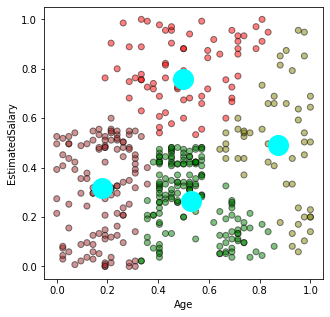

Iterasi : 8
Centroid : 
0.5049019607843137 0.7971677559912855
0.8706199460916436 0.4895877009084556
0.5285126396237506 0.27992684042066757
0.1803011803011803 0.31364355808800254


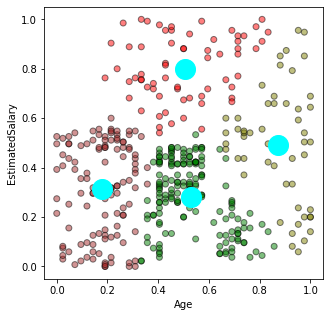

Iterasi : 9
Centroid : 
0.5018037518037518 0.8041526374859709
0.8749999999999994 0.49301994301994284
0.5301587301587302 0.2835914702581369
0.1803011803011803 0.31364355808800254


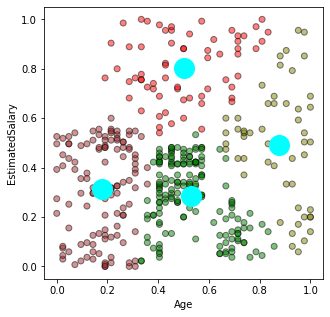

In [37]:
sna_baru = klaster(sna, att1, att2, 4)